# Exploration of negative binomial models on real data

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import re
import string
import warnings
from pathlib import Path
from time import time
from typing import Sequence, Union

import arviz as az
import janitor
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as gg
import pymc3 as pm
import seaborn as sns
from theano import tensor as tt

In [3]:
from src.analysis import pymc3_analysis as pmanal
from src.data_processing import achilles as achelp
from src.data_processing import common as dphelp
from src.data_processing import vectors as vhelp
from src.globals import PYMC3
from src.io import cache_io, data_io
from src.loggers import logger
from src.modeling import pymc3_sampling_api as pmapi
from src.plot.color_pal import FitMethodColors, ModelColors, SeabornColor

In [4]:
notebook_tic = time()

warnings.simplefilter(action="ignore", category=UserWarning)

gg.theme_set(
    gg.theme_classic()
    + gg.theme(
        figure_size=(4, 4),
        axis_ticks_major=gg.element_blank(),
        strip_background=gg.element_blank(),
    )
)
%config InlineBackend.figure_format = "retina"

RANDOM_SEED = 847
np.random.seed(RANDOM_SEED)

For this analysis, I used the subsample of CRC data.

In [5]:
crc_subsample_file = data_io.DataFile.crc_subsample
crc_modeling_data_subsample = pd.read_csv(data_io.data_path(crc_subsample_file))
crc_modeling_data_subsample.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,num_mutations,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,primary_or_metastasis,is_male,age
0,AACAACTAACTTTGTACAT,LS513_c903R1,0.226828,ERS717283.plasmid,chr8_81679130_-,IMPA1,sanger,True,8,81679130,...,0,NaN,NaN,NaN,False,0.957015,colorectal,primary,True,63.0
1,AACAAGATGTTTTGCCAAC,LS513_c903R1,0.245798,ERS717283.plasmid,chr17_7675205_-,TP53,sanger,True,17,7675205,...,0,NaN,NaN,NaN,False,0.970098,colorectal,primary,True,63.0
2,AACAGCTCGTTGTACCGCT,LS513_c903R1,-2.819159,ERS717283.plasmid,chr3_41225481_+,CTNNB1,sanger,True,3,41225481,...,0,NaN,NaN,NaN,False,0.964463,colorectal,primary,True,63.0
3,AACGCATACCTTGAGCAAG,LS513_c903R1,-1.188274,ERS717283.plasmid,chr3_71046949_+,FOXP1,sanger,True,3,71046949,...,0,NaN,NaN,NaN,False,0.949038,colorectal,primary,True,63.0
4,AAGTTCCTCTGAAGTTCGCA,LS513-311Cas9_RepA_p6_batch2,-0.182191,2,chr2_241704672_-,ING5,broad,True,2,241704672,...,0,NaN,NaN,NaN,False,0.973700,colorectal,primary,True,63.0


In [6]:
f"number of rows: {crc_modeling_data_subsample.shape[0]}"

'number of rows: 1443'

In [7]:
crc_modeling_data_subsample.hugo_symbol.unique()

array(['IMPA1', 'TP53', 'CTNNB1', 'FOXP1', 'ING5', 'NRAS', 'KRAS',
       'SEC23B', 'SOSTDC1', 'HSBP1L1', 'TMEM192', 'VCL', 'PLCD4',
       'SEC14L5', 'NOSTRIN', 'OTOF', 'APC', 'MDM2', 'CSDC2', 'MDM4',
       'INPP5A', 'FBXW7', 'KDELC1', 'TMPRSS3', 'FCN1', 'ADPRHL1',
       'CDK5RAP1', 'BRAF', 'LAPTM4B', 'RFWD3', 'KLF5', 'PTK2', 'DPY19L1',
       'RPL18A', 'SOWAHC', 'FAM92A', 'S100A7A', 'FUT7', 'PAFAH1B3',
       'DARS2', 'PLIN2', 'EEF1AKMT4', 'STK11', 'GATA6', 'SNX33',
       'EIF2AK1', 'TBX19', 'POU4F3', 'YY1', 'RPS26', 'CYTL1', 'ACVR1C',
       'SQLE', 'CCR3', 'NCDN', 'PLK5', 'POFUT2', 'SLC27A2', 'TXNDC17',
       'CCR9', 'GRIN2D', 'RTL3', 'PIK3CA', 'TMEM241'], dtype=object)

Unfortunately, most of the data points are missing read count data.
For now I will just drop these value.

In [8]:
# Percent of data missing read counts.
crc_modeling_data_subsample.read_counts.isna().mean()

0.604989604989605

In [9]:
data = (
    crc_modeling_data_subsample[~crc_modeling_data_subsample.read_counts.isna()]
    .copy()
    .reset_index(drop=True)
)

# Reset categorical data categories.
achelp.set_achilles_categorical_columns(data, sort_cats=True)

data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,num_mutations,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,primary_or_metastasis,is_male,age
0,AAGTTCCTCTGAAGTTCGCA,LS513-311Cas9_RepA_p6_batch2,-0.182191,2,chr2_241704672_-,ING5,broad,True,2,241704672,...,0,NaN,NaN,NaN,False,0.973700,colorectal,primary,True,63.0
1,AATGACTGAGTACAAACTGG,LS513-311Cas9_RepA_p6_batch2,-0.026600,2,chr1_114716144_-,NRAS,broad,True,1,114716144,...,0,NaN,NaN,NaN,False,0.958285,colorectal,primary,True,63.0
2,AATTACTACTTGCTTCCTGT,LS513-311Cas9_RepA_p6_batch2,-1.668700,2,chr12_25227402_+,KRAS,broad,True,12,25227402,...,1,False,True,True,True,0.963609,colorectal,primary,True,63.0
3,AGAAGTTTGGAGAGAGAACG,LS513-311Cas9_RepA_p6_batch2,-0.337427,2,chr5_112838158_+,APC,broad,True,5,112838158,...,0,NaN,NaN,NaN,False,1.262371,colorectal,primary,True,63.0
4,AGACACTTATACTATGAAAG,LS513-311Cas9_RepA_p6_batch2,-0.819049,2,chr12_68813623_+,MDM2,broad,True,12,68813623,...,0,NaN,NaN,NaN,False,0.963609,colorectal,primary,True,63.0


The following table shows the number of sgRNA for each gene.

In [10]:
data[["hugo_symbol", "sgrna"]].drop_duplicates().groupby(
    "hugo_symbol"
).count().sort_values("sgrna")

,sgrna
hugo_symbol,
ACVR1C,1
ING5,1
INPP5A,1
LAPTM4B,1
PAFAH1B3,1
PLCD4,1
PLIN2,1
PLK5,1
POU4F3,1


The next few plots show the distributino of LFC and read count values.

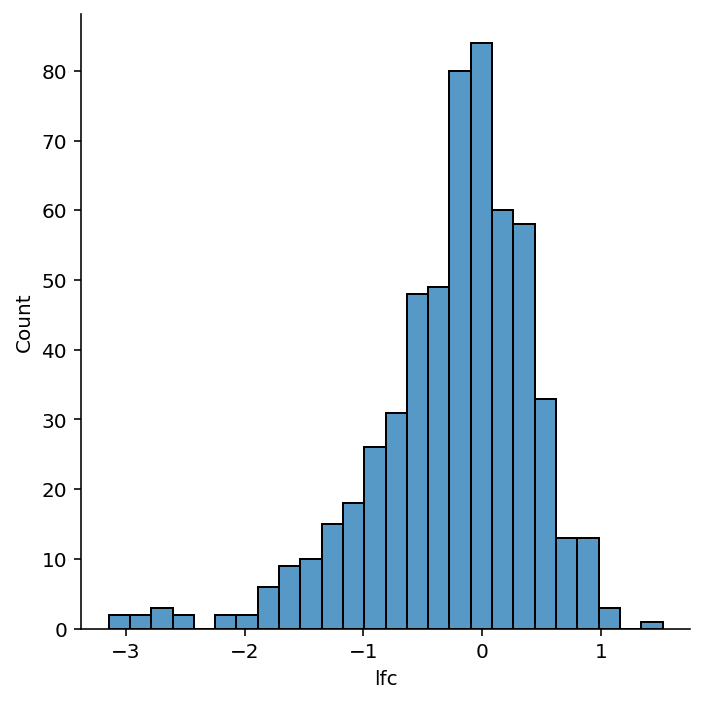

In [11]:
sns.displot(data=data, x="lfc");

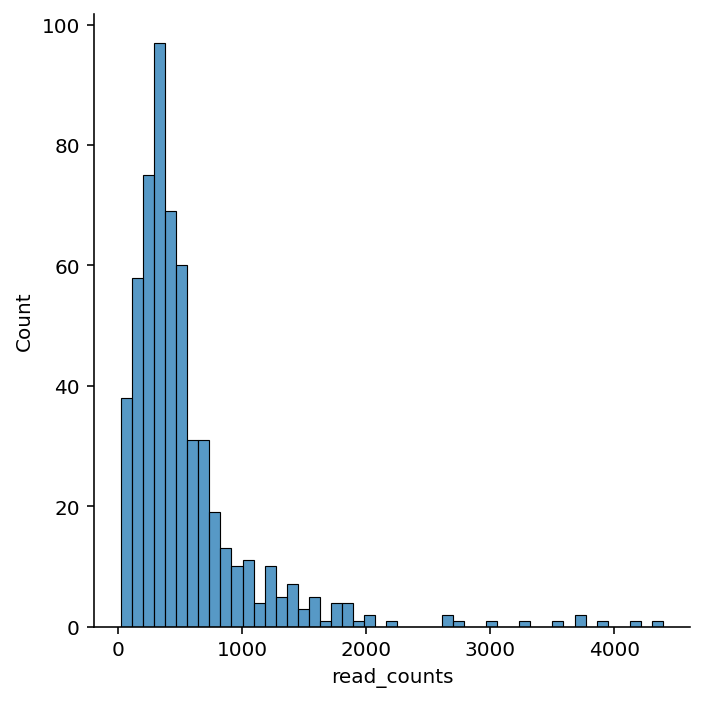

In [12]:
sns.displot(data=data, x="read_counts", kind="hist");

In [13]:
data.read_counts.agg(["mean", "var"])

mean       554.850877
var     313659.209709
Name: read_counts, dtype: float64

In [14]:
data["initial_reads"] = data.read_counts / (2 ** data.lfc)

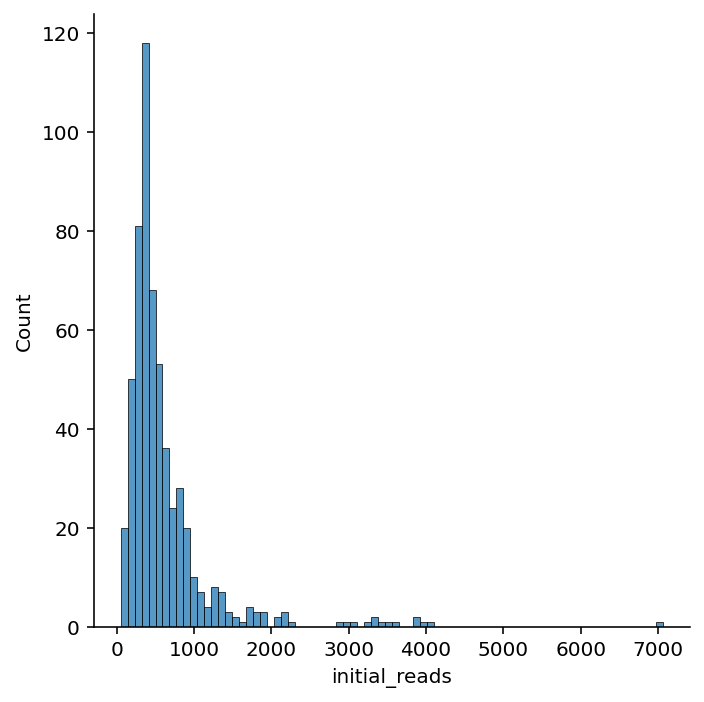

In [15]:
sns.displot(data, x="initial_reads", kind="hist");

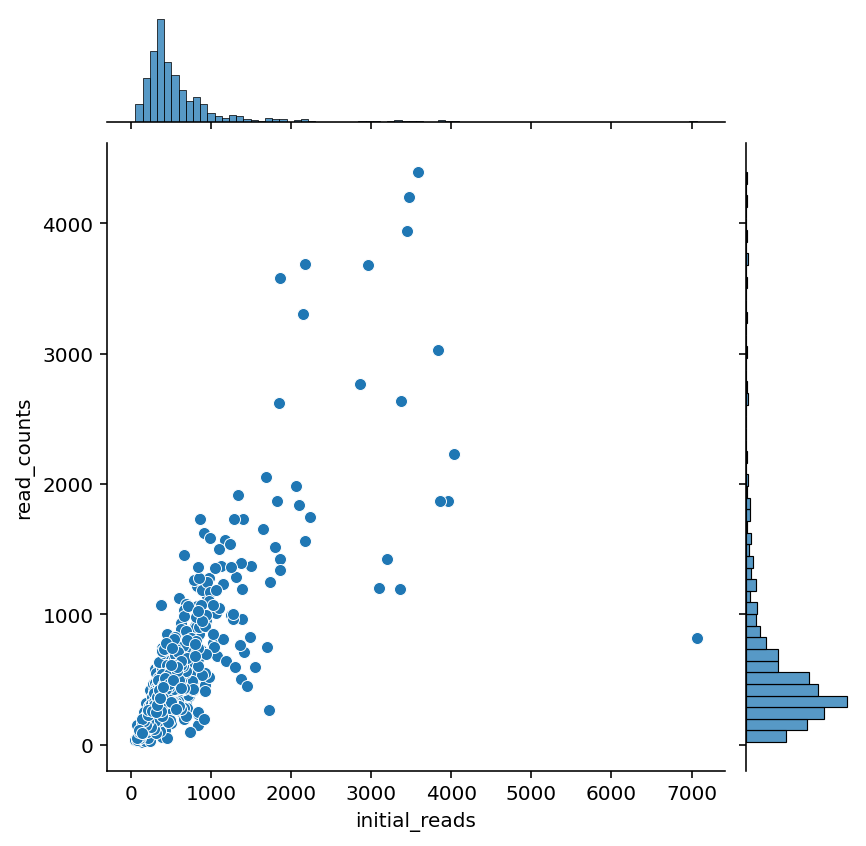

In [16]:
sns.jointplot(data=data, x="initial_reads", y="read_counts");

The following plot shows the distribution of reads with the *KRAS* data points highlighted for reference.

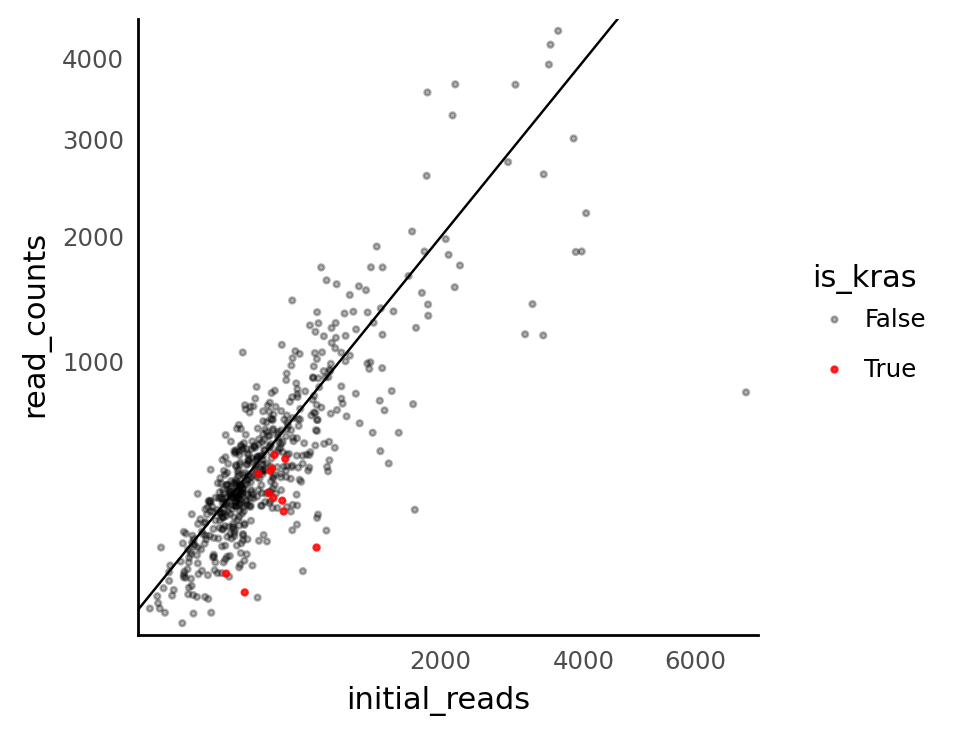

<ggplot: (359307508)>

In [17]:
plot_data = (
    data.copy().assign(is_kras=lambda d: d.hugo_symbol == "KRAS").sort_values("is_kras")
)

(
    gg.ggplot(plot_data, gg.aes(x="initial_reads", y="read_counts"))
    + gg.geom_point(gg.aes(color="is_kras", alpha="is_kras"), size=0.7)
    + gg.geom_abline(slope=1, intercept=0)
    + gg.scale_x_sqrt(expand=(0.02, 0, 0.02, 0))
    + gg.scale_y_sqrt(expand=(0.02, 0, 0.02, 0))
    + gg.scale_color_manual(values={True: "red", False: "k"})
    + gg.scale_alpha_manual(values={True: 0.8, False: 0.3})
)

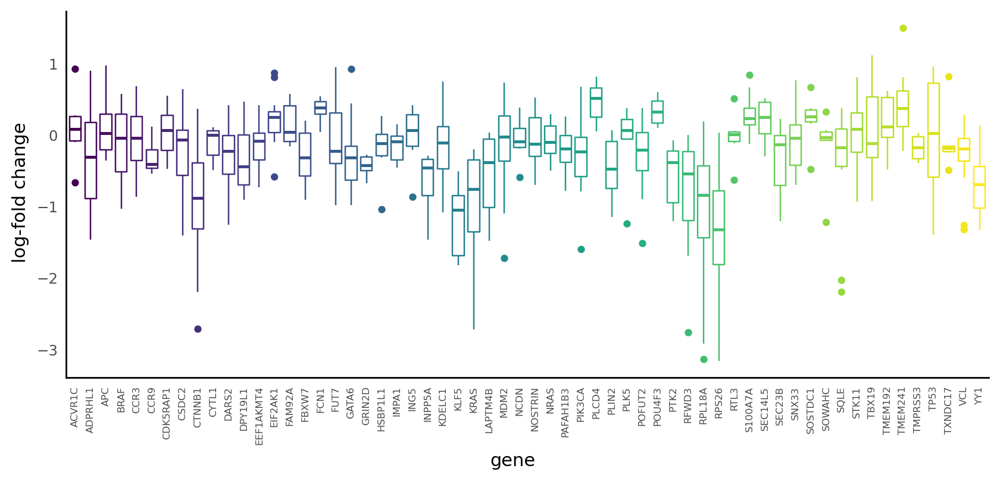

<ggplot: (359307984)>

In [18]:
(
    gg.ggplot(data, gg.aes(x="hugo_symbol", y="lfc"))
    + gg.geom_boxplot(gg.aes(color="hugo_symbol"))
    + gg.theme(
        axis_text_x=gg.element_text(angle=90, size=6),
        legend_position="none",
        figure_size=(10, 4),
    )
    + gg.labs(x="gene", y="log-fold change")
)

## Model 0. Single gene

For simplicity and to help me learn how to interpret coefficient values, the first model was just for the read counts of *KRAS*.
There are only 12 data points.

In [19]:
data_0 = data[data.hugo_symbol == "KRAS"].reset_index()
f"Number of data points: {data_0.shape[0]}."

'Number of data points: 12.'

Model `nb_m0`:

$$
\begin{gather}
\beta \sim N(0, 2.5) \\
\eta = \beta \\
\mu = \exp(\eta) \\
y \sim \text{NB}(\mu X_\text{initial}, \eta)
\end{gather}
$$

In [20]:
with pm.Model() as nb_m0:
    initial_reads = pm.Data("initial_reads", data_0.initial_reads.values)
    final_reads = pm.Data("final_reads", data_0.read_counts.values)

    β = pm.Normal("β", 0, 2.5)
    η = β
    μ = pm.math.exp(η)
    α = pm.HalfNormal("α", 5)
    y = pm.NegativeBinomial("y", μ * initial_reads, α, observed=final_reads)

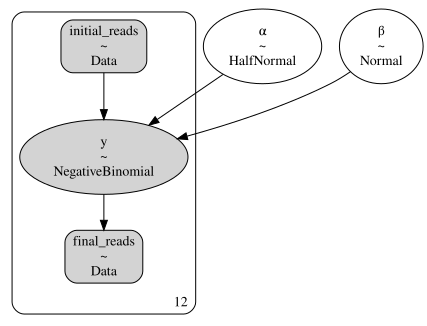

In [21]:
pm.model_to_graphviz(nb_m0)

In [22]:
with nb_m0:
    m0_trace = pm.sample(1000, chains=4, random_seed=820, return_inferencedata=True)
    m0_trace.extend(
        az.from_pymc3(posterior_predictive=pm.sample_posterior_predictive(m0_trace))
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [α, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 28 seconds.


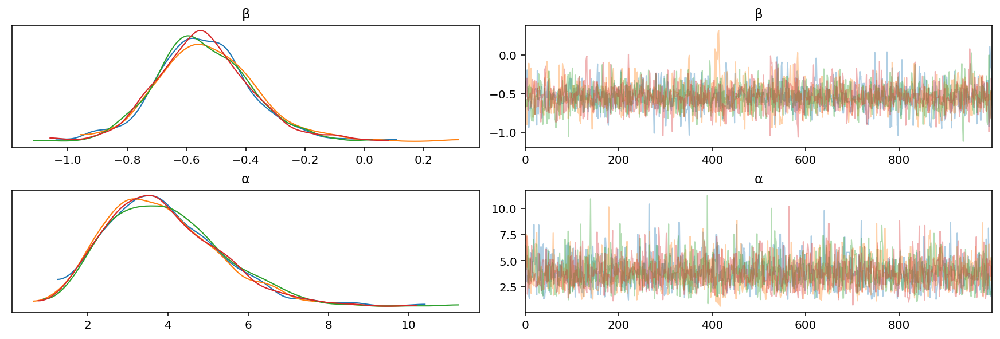

In [23]:
az.plot_trace(m0_trace, var_names=["β", "α"], compact=False);

In [24]:
az.summary(m0_trace, var_names=["β", "α"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,-0.539,0.162,-0.828,-0.208,0.003,0.002,2696.0,2024.0,1.0
α,3.882,1.413,1.551,6.580,0.029,0.021,2269.0,2151.0,1.0


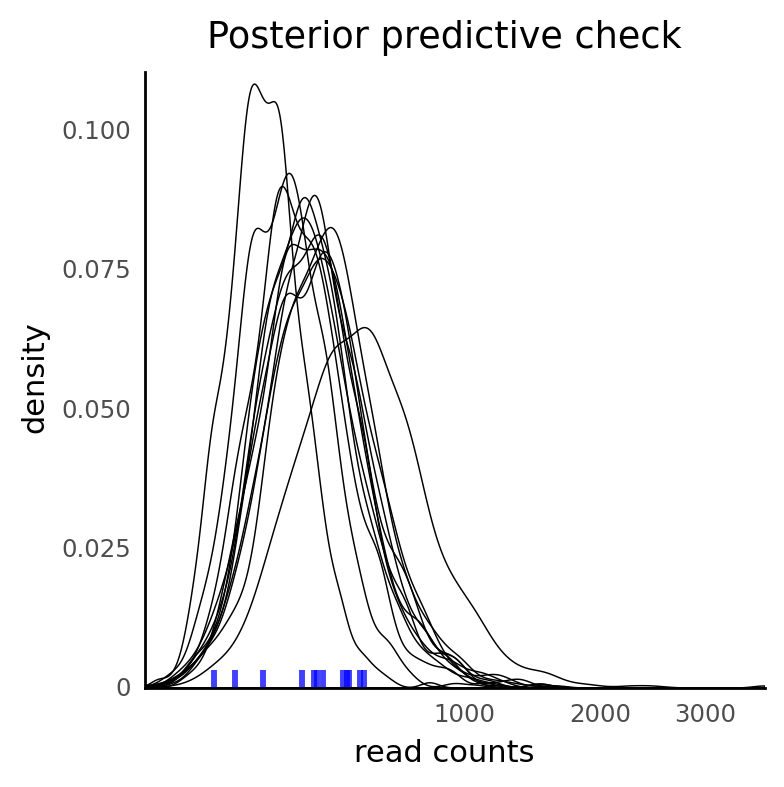

<ggplot: (365338609)>

In [25]:
m0_ppc = m0_trace["posterior_predictive"]["y"].squeeze().values
(
    gg.ggplot(pd.DataFrame(m0_ppc[:1000, :]).pivot_longer(), gg.aes(x="value"))
    + gg.geom_density(gg.aes(group="variable"), color="k", size=0.3, linetype="-")
    + gg.geom_rug(
        gg.aes(x="read_counts"), data=data_0, color="blue", size=1.2, alpha=0.75
    )
    + gg.scale_x_sqrt(expand=(0, 0))
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.labs(x="read counts", y="density", title="Posterior predictive check")
)

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions


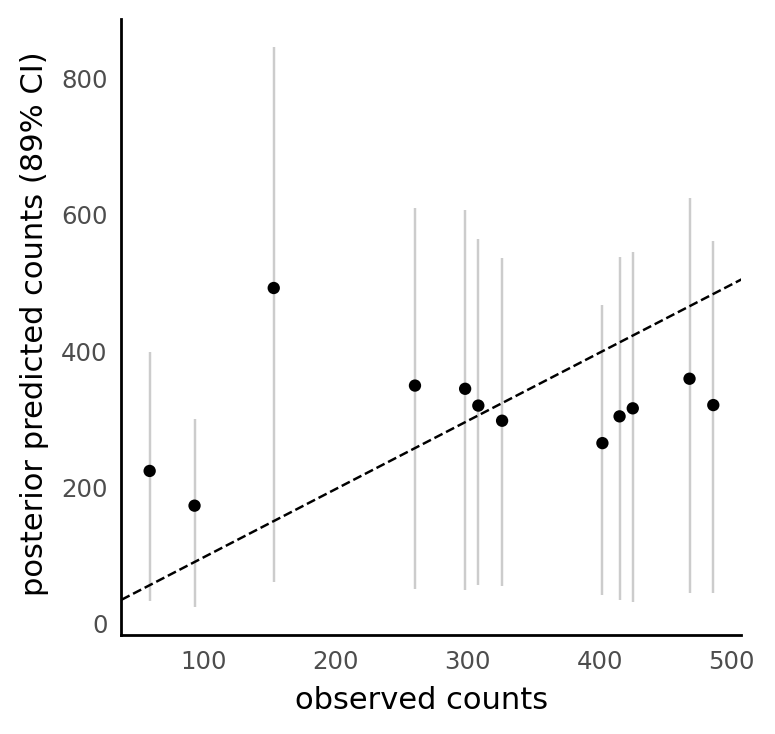

<ggplot: (363828899)>

In [26]:
m0_ppc_df = pmanal.summarize_posterior_predictions(
    m0_ppc, merge_with=data_0, observed_y="read_counts"
)
(
    gg.ggplot(m0_ppc_df, gg.aes(x="read_counts", y="pred_mean"))
    + gg.geom_linerange(gg.aes(ymin="pred_hdi_low", ymax="pred_hdi_high"), alpha=0.2)
    + gg.geom_point()
    + gg.geom_abline(slope=1, intercept=0, linetype="--")
    + gg.labs(x="observed counts", y="posterior predicted counts (89% CI)")
)

Below is the posterior point estimate for $\beta$ and the exponentiated value.

In [27]:
beta_post = m0_trace["posterior"]["β"].values.mean()
beta_post, np.exp(beta_post)

(-0.5389936736704781, 0.5833349824552863)

It is the same as the ratio of final to initial reads.

In [28]:
(data_0.read_counts / data_0.initial_reads).mean()

0.5752345646683334

### With full dataset
The model structure is the same as Model 0, except now the entire dataset is used instead of restricting to one gene.

In [29]:
with pm.Model() as nb_m0_full:
    initial_reads = pm.Data("initial_reads", data.initial_reads.values)
    final_reads = pm.Data("final_reads", data.read_counts.values)

    β = pm.Normal("β", 0, 2.5)
    η = β
    μ = pm.math.exp(η)
    α = pm.HalfNormal("α", 5)
    y = pm.NegativeBinomial("y", μ * initial_reads, α, observed=final_reads)

    m0_full_trace = pm.sample(
        1000, tune=2000, chains=4, random_seed=922, return_inferencedata=True
    )
    m0_full_trace.extend(
        az.from_pymc3(
            posterior_predictive=pm.sample_posterior_predictive(
                m0_full_trace, random_seed=923
            )
        )
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [α, β]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 30 seconds.


In [30]:
trace_collection: dict[str, az.InferenceData] = {"(m0) single β": m0_full_trace}

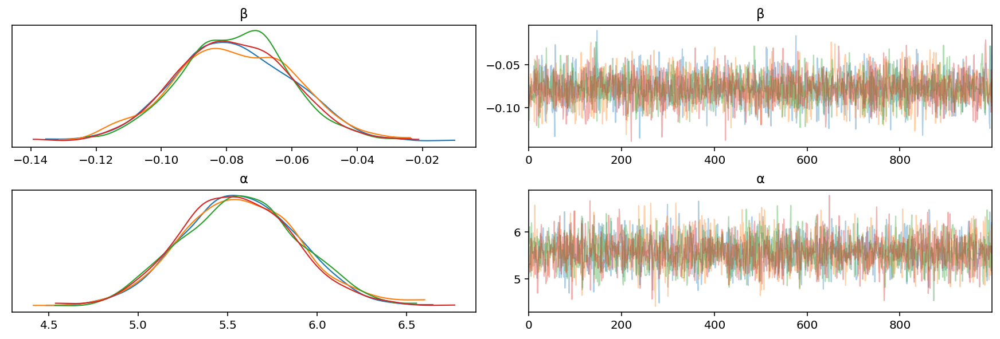

In [31]:
az.plot_trace(m0_full_trace, compact=False);

In [32]:
az.summary(m0_full_trace, var_names=["β", "α"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,-0.078,0.018,-0.112,-0.046,0.000,0.000,3451.0,2733.0,1.0
α,5.567,0.324,4.981,6.183,0.006,0.004,3188.0,2712.0,1.0


/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions


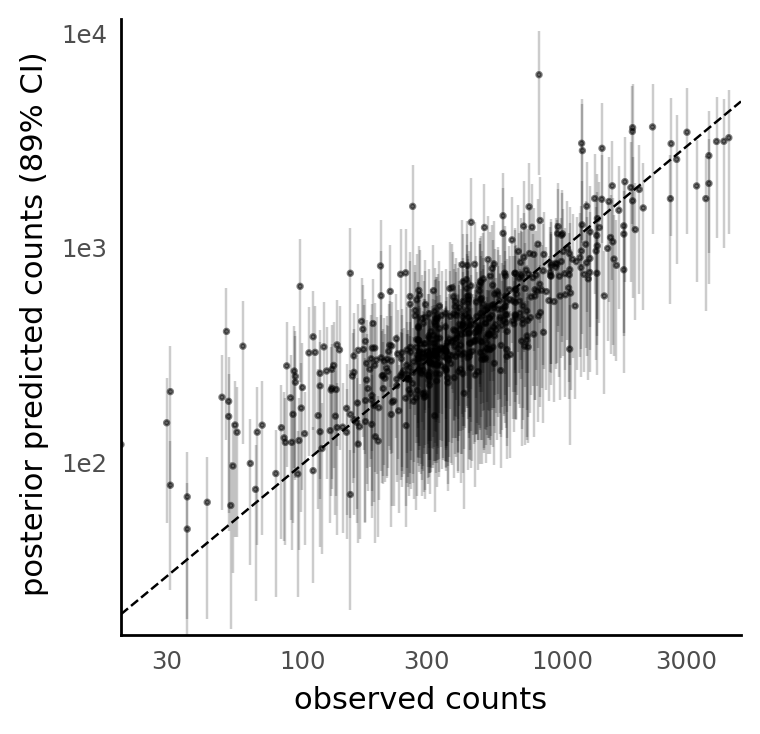

<ggplot: (363824086)>

In [33]:
m0_full_ppc_df = pmanal.summarize_posterior_predictions(
    m0_full_trace["posterior_predictive"]["y"].squeeze().values,
    merge_with=data,
    observed_y="read_counts",
)

(
    gg.ggplot(m0_full_ppc_df, gg.aes(x="read_counts", y="pred_mean"))
    + gg.geom_linerange(gg.aes(ymin="pred_hdi_low", ymax="pred_hdi_high"), alpha=0.2)
    + gg.geom_point(size=0.5, alpha=0.5)
    + gg.geom_abline(slope=1, intercept=0, linetype="--")
    + gg.scale_x_log10(expand=(0, 0, 0.02, 0))
    + gg.scale_y_log10(expand=(0, 0, 0.02, 0))
    + gg.labs(x="observed counts", y="posterior predicted counts (89% CI)")
)

In [34]:
beta = m0_full_trace["posterior"]["β"].values.mean()
beta, np.exp(beta)

(-0.07774960581655685, 0.9251960612546195)

In [35]:
np.mean(data.read_counts / data.initial_reads)

0.9247845993336123

## Model 1. Varying per gene

The first model is simple with a varying intercept per gene.
The starting read count is treated as an exposure value and multiplied directly against $\mu$.

$$
\begin{gather}
\mu_\beta \sim N(0, 5) \\
\sigma_\beta \sim HN(5) \\
\beta_g \sim_g N(\mu_\beta, \sigma_\beta) \\
\eta = \beta_g[\text{gene}] \\
\mu = \exp(\eta) \\
\alpha = HN(5) \\
y \sim \text{NB}(\mu X_\text{initial}, \alpha)
\end{gather}
$$

In [36]:
n_genes = len(data.hugo_symbol.unique())
gene_idx = dphelp.get_indices(data, "hugo_symbol")

with pm.Model() as nb_m1:
    g = pm.Data("gene_idx", gene_idx)
    initial_reads = pm.Data("initial_reads", data.initial_reads)
    final_reads = pm.Data("final_reads", data.read_counts)

    μ_β = pm.Normal("μ_β", 0, 2.5)
    σ_β = pm.HalfNormal("σ_β", 2.5)
    β_g = pm.Normal("β_g", μ_β, σ_β, shape=n_genes)
    η = pm.Deterministic("η", β_g[g])
    μ = pm.Deterministic("μ", pm.math.exp(η))
    α = pm.HalfNormal("α", 5)
    y = pm.NegativeBinomial("y", μ * initial_reads, α, observed=final_reads)

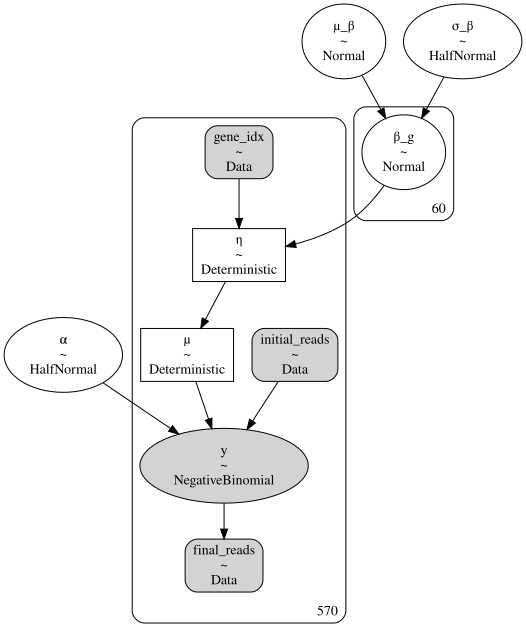

In [37]:
pm.model_to_graphviz(nb_m1)

In [38]:
with nb_m1:
    m1_trace = pm.sample(1000, tune=2000, random_seed=1022, return_inferencedata=True)
    m1_trace.extend(
        az.from_pymc3(
            posterior_predictive=pm.sample_posterior_predictive(
                m1_trace, random_seed=1022
            )
        )
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [α, β_g, σ_β, μ_β]


Sampling 2 chains for 2_000 tune and 1_000 draw iterations (4_000 + 2_000 draws total) took 32 seconds.


In [39]:
trace_collection["(m1): varying β"] = m1_trace

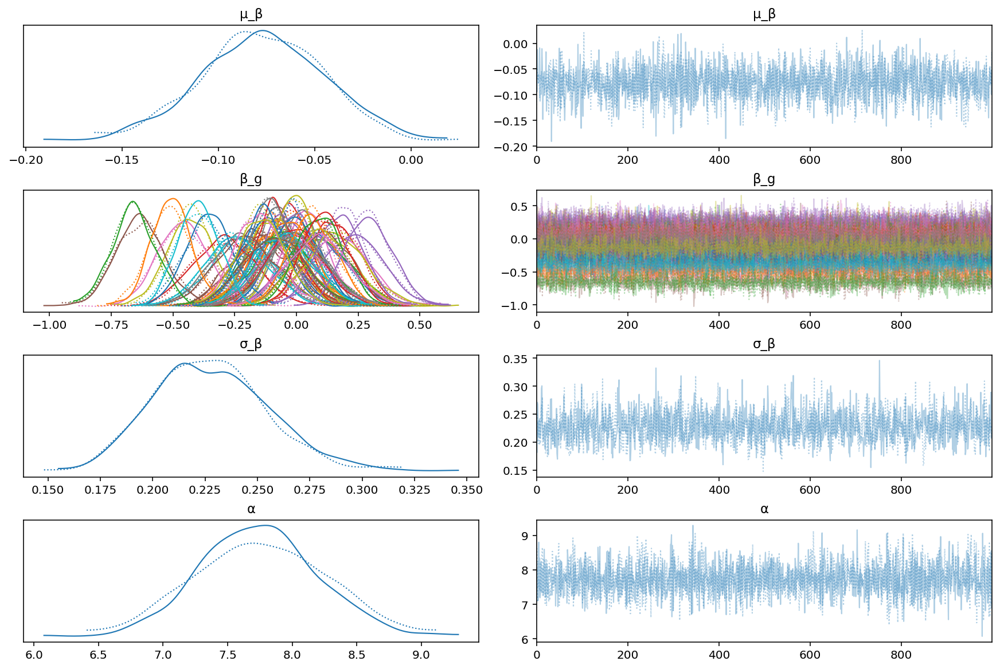

In [40]:
az.plot_trace(m1_trace, var_names=["α", "β"], filter_vars="like");

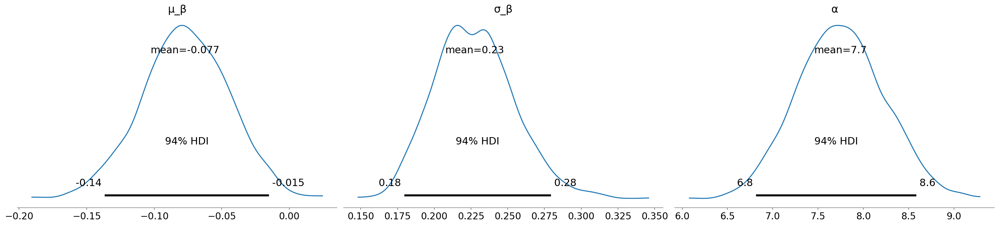

In [41]:
az.plot_posterior(m1_trace, var_names=["μ_β", "σ_β", "α"]);

The interpretation of the values for $\beta_g$ are as follows: For gene $j$, the expected fold change to the number of final reads is $\exp(\beta_j)$.
In other words, the final number of reads is the initial number of reads times $\exp(\beta_j)$.
Alternatively, $\beta_j$ is the expected log fold change for gene $j$.
These are demonstrated to be equivalent below.

$$
\begin{gather}
\exp(\beta_j) = \frac{f}{i} \\
\beta_j = \log \frac{f}{i} \quad \text{ or } \quad ie^{\beta_j} = f
\end{gather}
$$

Therefore, if $\beta_j = 0$, there is expected to be no change to the number of reads before and after: $i e^0 = i = f$.
If $\beta_j$ is positive, then there is expected to be an increase in the number of reads and if $\beta_j$ is negative, a decrease in the number of reads.

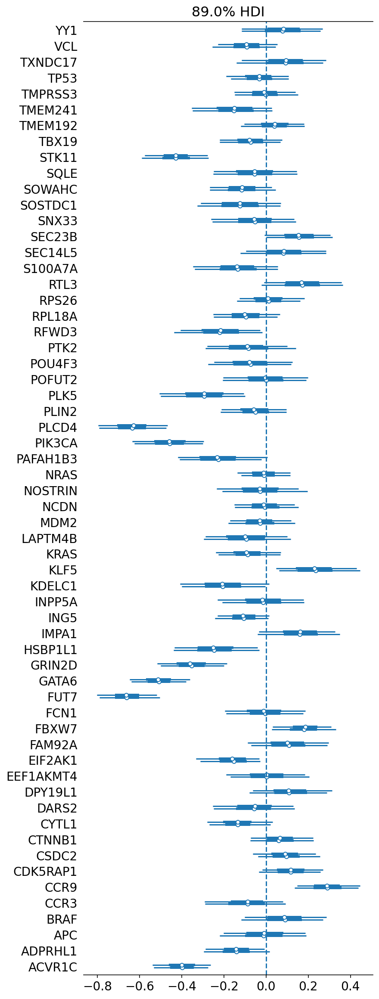

In [42]:
ax = az.plot_forest(m1_trace, var_names="β_g", hdi_prob=0.89)
ax[0].set_yticklabels(data.hugo_symbol.cat.categories)
plt.axvline(x=0, ls="--")
plt.show()

In [43]:
az.summary(m1_trace, var_names="β_g", hdi_prob=0.89).assign(
    hugo_symbol=data.hugo_symbol.cat.categories
)

,mean,sd,hdi_5.5%,hdi_94.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,hugo_symbol
β_g[0],0.083,0.118,-0.120,0.258,0.002,0.002,4051.0,1558.0,1.00,ACVR1C
β_g[1],-0.091,0.093,-0.233,0.058,0.001,0.002,3867.0,1389.0,1.00,ADPRHL1
β_g[2],0.094,0.126,-0.116,0.289,0.002,0.002,3561.0,1389.0,1.00,APC
β_g[3],-0.033,0.090,-0.181,0.107,0.001,0.002,4685.0,1691.0,1.00,BRAF
β_g[4],-0.005,0.092,-0.149,0.147,0.002,0.002,3684.0,1377.0,1.00,CCR3
β_g[5],-0.148,0.121,-0.350,0.027,0.002,0.002,4702.0,1614.0,1.00,CCR9
β_g[6],0.041,0.094,-0.112,0.181,0.002,0.002,3739.0,1445.0,1.00,CDK5RAP1
β_g[7],-0.076,0.092,-0.217,0.076,0.002,0.002,3574.0,1243.0,1.01,CSDC2
β_g[8],-0.427,0.096,-0.581,-0.274,0.002,0.001,2776.0,1308.0,1.00,CTNNB1
β_g[9],-0.053,0.126,-0.248,0.148,0.002,0.003,3735.0,1260.0,1.00,CYTL1


The following plot shows the raw data for a few genes with large posterior estimates for $\beta$ in model 1.

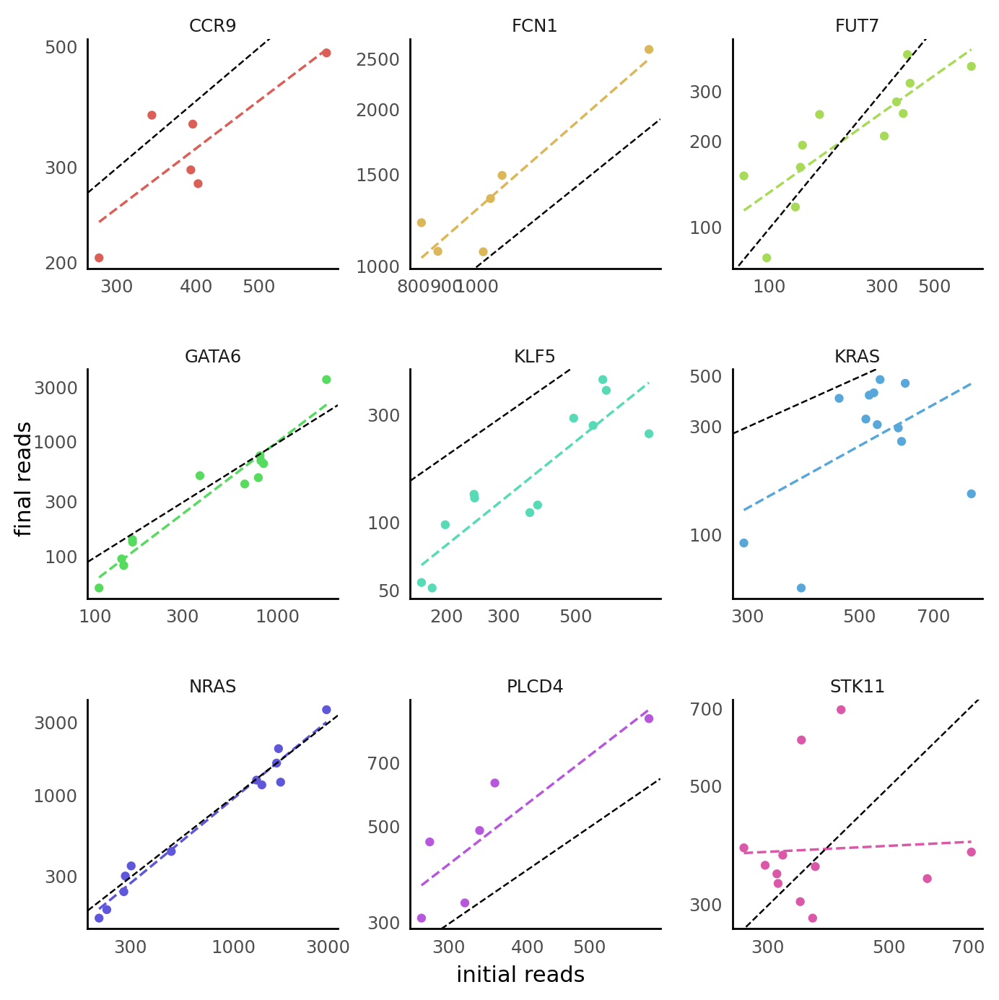

<ggplot: (364641687)>

In [44]:
g = ["FUT7", "STK11", "GATA6", "KRAS", "KLF5", "CCR9", "FCN1", "NRAS", "PLCD4"]

(
    gg.ggplot(
        data[data.hugo_symbol.isin(g)].astype({"hugo_symbol": str}),
        gg.aes(x="initial_reads", y="read_counts", color="hugo_symbol"),
    )
    + gg.facet_wrap("~ hugo_symbol", ncol=3, scales="free")
    + gg.geom_point()
    + gg.geom_smooth(method="lm", formula="y~x", se=False, size=0.7, linetype="--")
    + gg.geom_abline(slope=1, intercept=0, linetype="--", color="k")
    + gg.scale_x_log10()
    + gg.scale_y_log10()
    + gg.theme(figure_size=(8, 8), panel_spacing=0.5, legend_position="none")
    + gg.labs(x="initial reads", y="final reads")
)

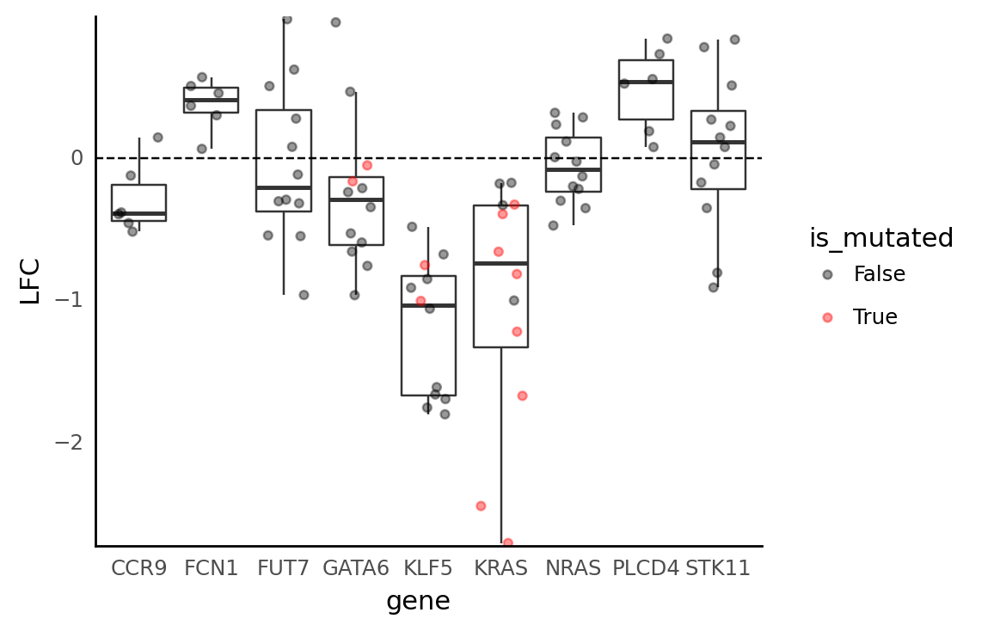

<ggplot: (365086091)>

In [45]:
(
    gg.ggplot(
        data[data.hugo_symbol.isin(g)].astype({"hugo_symbol": str}),
        gg.aes(x="hugo_symbol", y="lfc"),
    )
    + gg.geom_boxplot(outlier_alpha=0)
    + gg.geom_jitter(gg.aes(color="is_mutated"), width=0.3, height=0, alpha=0.4)
    + gg.geom_hline(yintercept=0, linetype="--")
    + gg.scale_y_continuous(expand=(0, 0.02, 0, 0.02))
    + gg.scale_color_manual(values={True: "red", False: "black"})
    + gg.theme(figure_size=(5, 4))
    + gg.labs(x="gene", y="LFC")
)

In this model, $\mu_\beta$ represents the average change in read counts.
Therefore, $\exp(\mu_\beta)$ is the same as the average fold change ($\frac{\text{final}}{\text{initial}}$).

In [46]:
mu_beta = m1_trace["posterior"]["μ_β"].values.mean()
sigma_beta = m1_trace["posterior"]["σ_β"].values.mean()
mu_beta, np.exp(mu_beta), np.mean(data.read_counts / data.initial_reads)

(-0.07720980439205351, 0.9256956182250815, 0.9247845993336123)

As the coefficient $\mu_\beta$ represents the average fold change over all genes, the coefficients $\beta_g$ represent individual gene fold changes.
The observed values and model posterior distribtuions are plotted below.
For each gene $j$, the circle and vertical line represent the mean and 89% CI of the posterior distribution for $\exp(\beta_j)$.
The dashed blue horizontal line represents the mean of the posterior for $\mu_\beta$.
The blue `x` represents the average observed fold change for the gene and the size of the `x` represents the number of data points for that gene.

This plot shows clearly the shrinkage of the estimates for $\beta_g$ towards the global mean.
Also, there is noticably less shrinkage for the genes with more data points — for example, compare the level of shrinkage for *PLCD4* and *TMEM241* (the genes with the two highest observed fold change value), both have similar observed averages, but there are more data points supporting *TMEM241*.

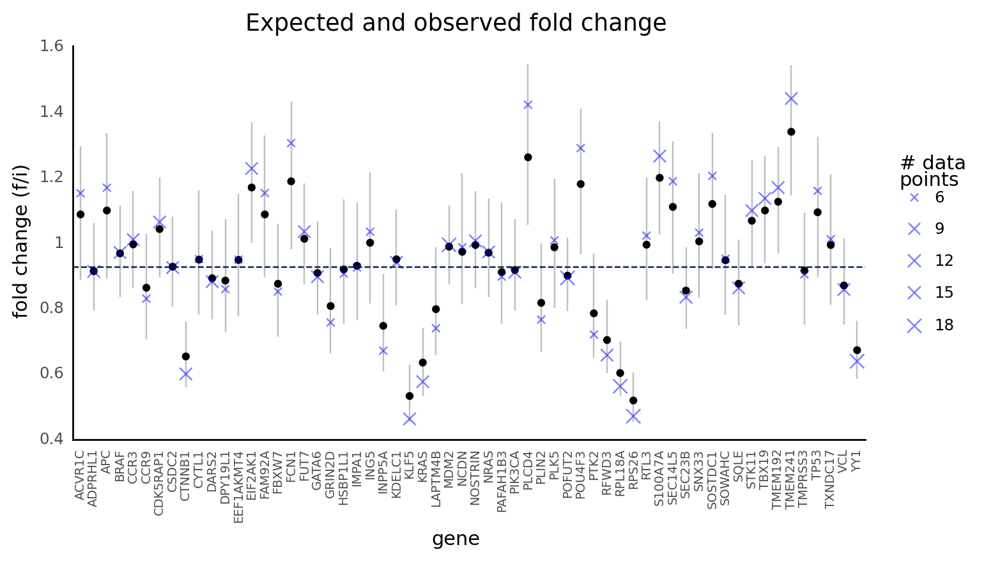

<ggplot: (365399827)>

In [47]:
gene_fold_change = (
    data.groupby("hugo_symbol")
    .apply(lambda d: np.mean(d.read_counts / d.initial_reads))
    .reset_index(drop=False)
    .rename(columns={0: "fold_change"})
)

num_data_points_per_gene = (
    data.groupby("hugo_symbol")[["read_counts"]].count().reset_index().read_counts
)

beta_g_posterior = (
    az.summary(m1_trace, var_names=["β_g"], hdi_prob=0.89)
    .reset_index(drop=False)
    .rename(
        columns={"index": "parameter", "hdi_5.5%": "hdi_low", "hdi_94.5%": "hdi_high"}
    )
    .assign(
        fold_change=gene_fold_change.fold_change,
        hugo_symbol=gene_fold_change.hugo_symbol,
        n_dp=num_data_points_per_gene,
    )
)

(
    gg.ggplot(beta_g_posterior, gg.aes(x="hugo_symbol"))
    + gg.geom_linerange(
        gg.aes(ymin="np.exp(hdi_low)", ymax="np.exp(hdi_high)"), alpha=0.25
    )
    + gg.geom_point(gg.aes(y="np.exp(mean)"))
    + gg.geom_point(
        gg.aes(y="fold_change", size="n_dp"), shape="x", color="blue", alpha=0.5
    )
    + gg.geom_hline(yintercept=np.exp(mu_beta), color="#011F4B", linetype="--")
    + gg.scale_size_continuous(range=(2, 4))
    + gg.theme(axis_text_x=gg.element_text(angle=90, size=7), figure_size=(8, 4))
    + gg.labs(
        x="gene",
        y="fold change (f/i)",
        title="Expected and observed fold change",
        size="# data\npoints",
    )
)

Below are some explorations of the posterior predictions of the model.
Generally, they make sense and seem reasonable.

In [48]:
def down_sample_ppc(ppc_ary: np.ndarray, n: int) -> tuple[np.ndarray, np.ndarray]:
    r_idx = np.arange(ppc_ary.shape[1])
    np.random.shuffle(r_idx)
    return ppc_ary[:, r_idx[:n]], r_idx

In [49]:
m1_ppc_sample, sample_idx = down_sample_ppc(
    m1_trace["posterior_predictive"]["y"].squeeze().values, n=10
)

In [50]:
m1_ppc_df = (
    pd.concat(
        [
            pd.DataFrame(m1_ppc_sample.T),
            data.loc[sample_idx[:10], :][["hugo_symbol", "sgrna"]].reset_index(
                drop=True
            ),
        ],
        axis=1,
    )
    .assign(ppc_idx=lambda d: np.arange(d.shape[0]))
    .pivot_longer(
        index=["hugo_symbol", "sgrna", "ppc_idx"], names_to="_to_drop", values_to="draw"
    )
    .drop(columns="_to_drop")
)

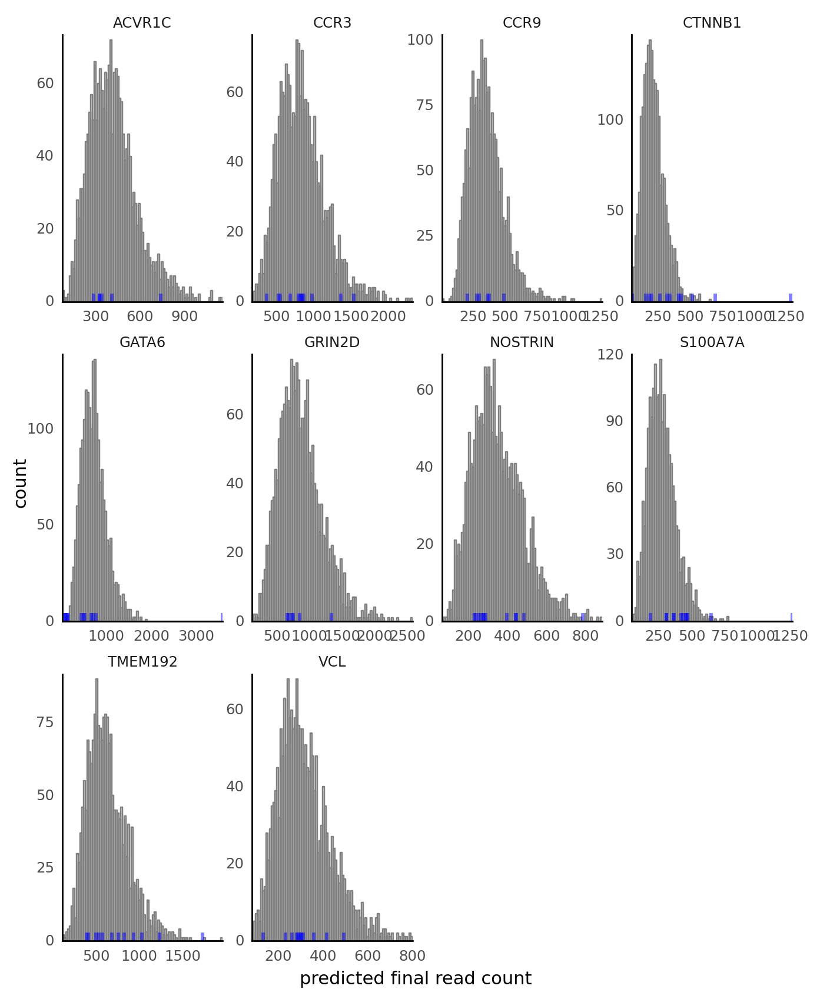

<ggplot: (365995731)>

In [51]:
(
    gg.ggplot(m1_ppc_df)
    + gg.facet_wrap("~hugo_symbol", ncol=4, scales="free")
    + gg.geom_histogram(gg.aes(x="draw"), color="grey", fill="grey", alpha=0.2)
    + gg.geom_rug(
        gg.aes(x="read_counts"),
        data=data[data.hugo_symbol.isin(m1_ppc_df.hugo_symbol)],
        color="b",
        size=1.2,
        alpha=0.5,
    )
    + gg.scale_x_continuous(expand=(0, 0))
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.theme(figure_size=(8, 10), panel_spacing_x=0.25, panel_spacing_y=0.25)
    + gg.labs(x="predicted final read count", y="count")
)

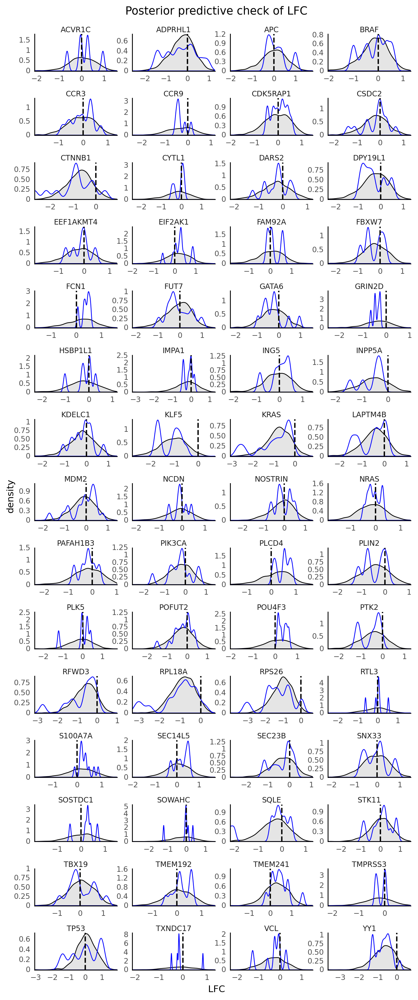

<ggplot: (366401651)>

In [52]:
ppc_lfc = (
    m1_trace["posterior_predictive"]["y"].squeeze()
    / data.initial_reads.values.reshape(1, -1)
).values
ppc_lfc = np.log2(ppc_lfc)

ppc_lfc_df = (
    pd.concat([pd.DataFrame(ppc_lfc[:100, :].T), data[["hugo_symbol", "lfc"]]], axis=1)
    .pivot_longer(index=["hugo_symbol", "lfc"], values_to="ppc_lfc")
    .drop(columns=["variable"])
)

(
    gg.ggplot(ppc_lfc_df)
    + gg.facet_wrap("~hugo_symbol", ncol=4, scales="free")
    + gg.geom_density(gg.aes(x="ppc_lfc"), color="k", fill="k", alpha=0.1)
    + gg.geom_density(gg.aes(x="lfc"), color="b")
    + gg.geom_vline(xintercept=0, linetype="--", color="k", size=0.9)
    + gg.scale_x_continuous(expand=(0, 0))
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.theme(figure_size=(8, 20), panel_spacing_x=0.25, panel_spacing_y=0.25)
    + gg.labs(x="LFC", y="density", title="Posterior predictive check of LFC")
)

## Model 2

The second model includes the initial number of reads as a parameter in the linear portion of the model instead of as an exposure.
This perhaps will make the value of $\beta$ make more sense.

$$
\begin{gather}
\mu_\beta \sim N(0, 5) \\
\sigma_\beta \sim HN(5) \\
\beta_g \sim_g N(\mu_\beta, \sigma_\beta) \\
\eta = \beta_g[\text{gene}] X_\text{initial} \\
\mu = \exp(\eta) \\
\alpha = HN(5) \\
y \sim \text{NB}(\mu, \alpha)
\end{gather}
$$

In [53]:
def noncentered_normal(name, shape, μ=None):
    if μ is None:
        μ = pm.Normal(f"μ_{name}", 0.0, 2.5)

    Δ = pm.Normal(f"Δ_{name}", 0.0, 1.0, shape=shape)
    σ = pm.HalfNormal(f"σ_{name}", 2.5)

    return pm.Deterministic(name, μ + Δ * σ)


with pm.Model() as nb_m2:
    g = pm.Data("gene_idx", gene_idx)
    log_initial_reads = pm.Data("log_initial_reads", np.log(data.initial_reads.values))
    final_reads = pm.Data("final_reads", data.read_counts.values)

    μ_β = pm.Normal("μ_β", 0, 2.5)
    σ_β = pm.HalfNormal("σ_β", 2.5)
    β = pm.Normal("β", μ_β, σ_β, shape=n_genes)

    η = pm.Deterministic("η", β[g] * log_initial_reads)

    μ = pm.Deterministic("μ", pm.math.exp(η))
    α = pm.HalfNormal("α", 5.0)

    y = pm.NegativeBinomial("y", μ, α, observed=final_reads)

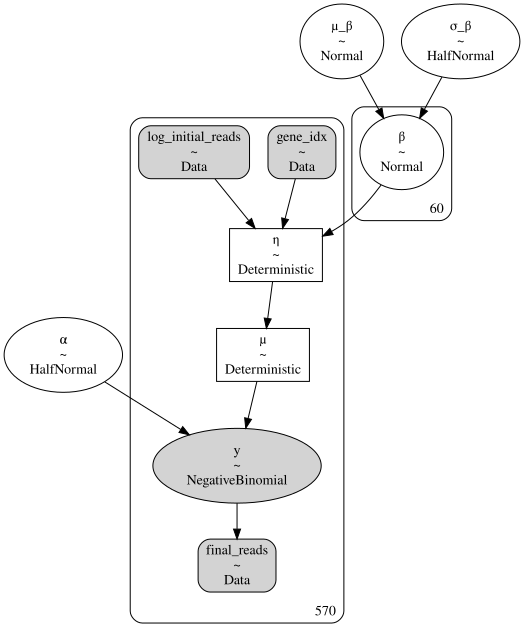

In [54]:
pm.model_to_graphviz(nb_m2)

In [55]:
with nb_m2:
    m2_trace = pm.sample(1000, tune=2000, return_inferencedata=True)
    m2_trace.extend(
        az.from_pymc3(posterior_predictive=pm.sample_posterior_predictive(m2_trace))
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [α, β, σ_β, μ_β]


Sampling 2 chains for 2_000 tune and 1_000 draw iterations (4_000 + 2_000 draws total) took 37 seconds.


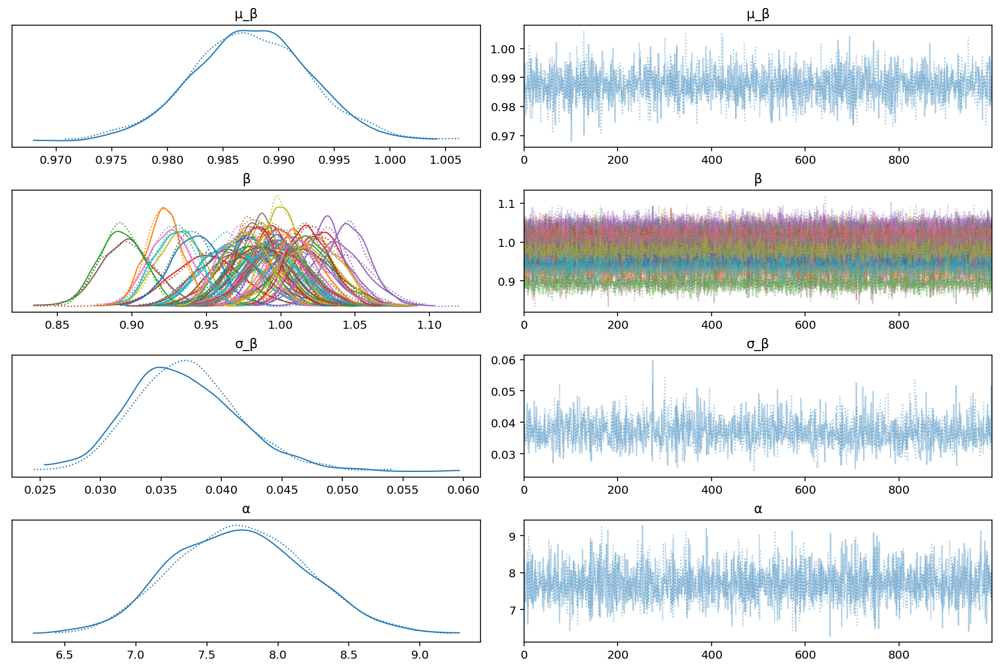

In [56]:
az.plot_trace(m2_trace, var_names=["α", "β"], filter_vars="like");

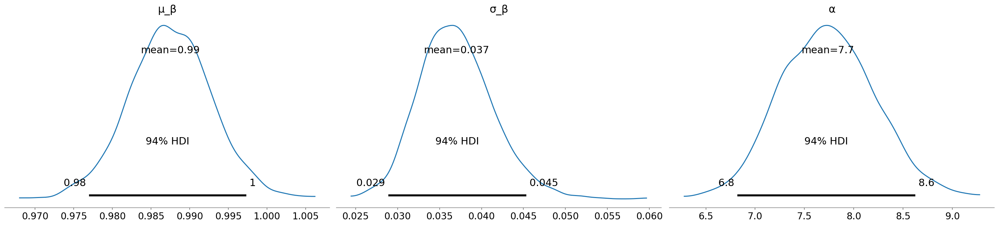

In [57]:
az.plot_posterior(m2_trace, var_names=["μ_β", "σ_β", "α"]);

The relationship between initial and final read counts and the values for $\beta_g$ are slightly different than in model 1.
The relevant part of the formula for model 2 is shown below:

$$
\begin{gather}
\eta = \beta_g \times \log(x_i) \\
\mu = e^\eta \\
y \sim \text{NB}(\mu, \alpha)
\end{gather}
$$

If we collapse $\eta$, we get

$$
\mu = e^{\beta_g \times \log(x_i)}
$$

which can be further simplified

$$
\begin{aligned}
\mu &= e^{\beta_g \times \log(x_i)} \\
 &= (e^{\log(x_i)})^{\beta_g} \\
 &= x_i^{\beta_g}
\end{aligned}
$$

Thus, instead of $f = ie^\beta$ as in model 1, the relationship is $f = i^\beta$ (where $f$ is the final read count and $i$ is the initial read count).
I demonstrate this is relationship is true after the forest plot of the posteriors for $\beta_g$ below.

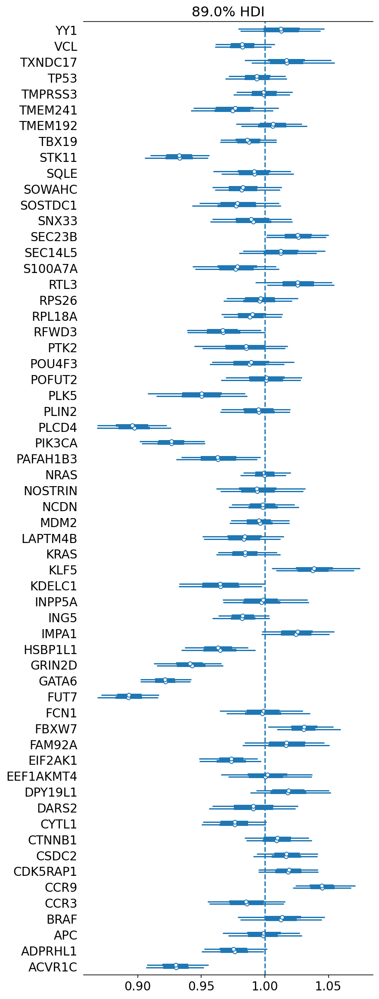

In [58]:
ax = az.plot_forest(m2_trace, var_names="β", hdi_prob=0.89)
ax[0].set_yticklabels(data.hugo_symbol.cat.categories)
plt.axvline(x=1, ls="--")
plt.show()

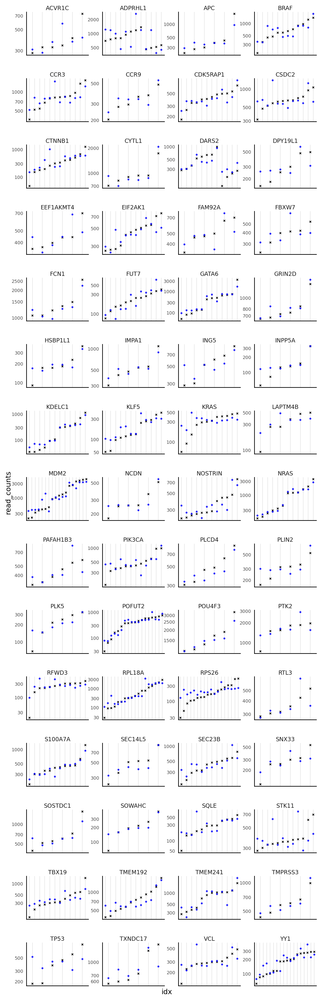

<ggplot: (363142331)>

In [59]:
beta_post = pd.DataFrame(
    {
        "hugo_symbol": data.hugo_symbol.cat.categories,
        "beta": m2_trace["posterior"]["β"].values.reshape(-1, n_genes).mean(axis=0),
    }
)

m2_post_pred_calc = (
    data[["hugo_symbol", "read_counts", "initial_reads"]]
    .merge(beta_post, on="hugo_symbol", how="left")
    .assign(pred_f_counts=lambda d: d.initial_reads ** d.beta)
)


(
    gg.ggplot(
        m2_post_pred_calc.sort_values(["hugo_symbol", "read_counts"]).assign(
            idx=lambda d: np.arange(d.shape[0]).astype(str)
        ),
        gg.aes(x="idx"),
    )
    + gg.facet_wrap("~ hugo_symbol", ncol=4, scales="free")
    + gg.geom_point(gg.aes(y="read_counts"), color="black", shape="x", size=1, alpha=1)
    + gg.geom_point(gg.aes(y="pred_f_counts"), color="blue", size=0.7, alpha=0.75)
    + gg.scale_y_log10()
    + gg.theme(
        axis_text_x=gg.element_blank(),
        axis_text_y=gg.element_text(size=7),
        figure_size=(8, 27),
        panel_spacing=0.3,
        panel_grid_major_x=gg.element_line(),
    )
)

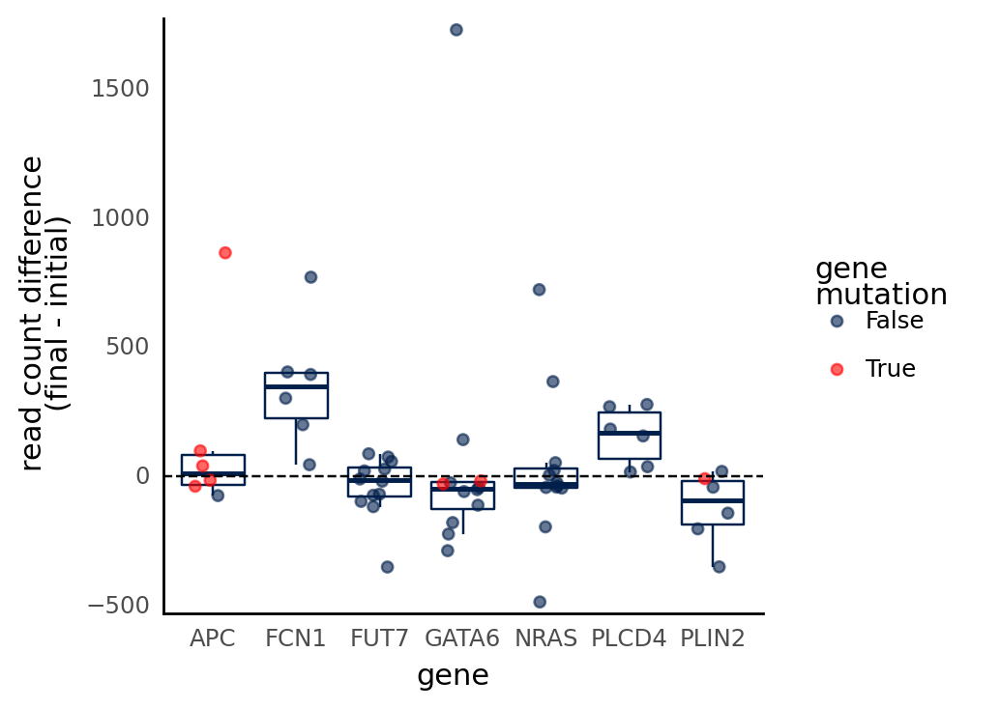

<ggplot: (367013479)>

In [60]:
g = ["APC", "FCN1", "NRAS", "PLIN2", "FUT7", "GATA6", "PLCD4"]

(
    gg.ggplot(
        data[data.hugo_symbol.isin(g)]
        .astype({"hugo_symbol": str})
        .assign(count_diff=lambda d: d.read_counts - d.initial_reads)
        .sort_values("is_mutated"),
        gg.aes(x="hugo_symbol", y="count_diff"),
    )
    + gg.geom_boxplot(outlier_alpha=0, color="#011F4B")
    + gg.geom_jitter(
        gg.aes(color="is_mutated"), width=0.25, height=0, alpha=0.6, size=1.8
    )
    + gg.geom_hline(yintercept=0, linetype="--")
    + gg.scale_y_continuous(expand=(0.02, 0, 0.02, 0))
    + gg.scale_color_manual(values={True: "red", False: "#011F4B"})
    + gg.labs(
        x="gene", y="read count difference\n(final - initial)", color="gene\nmutation"
    )
)

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions


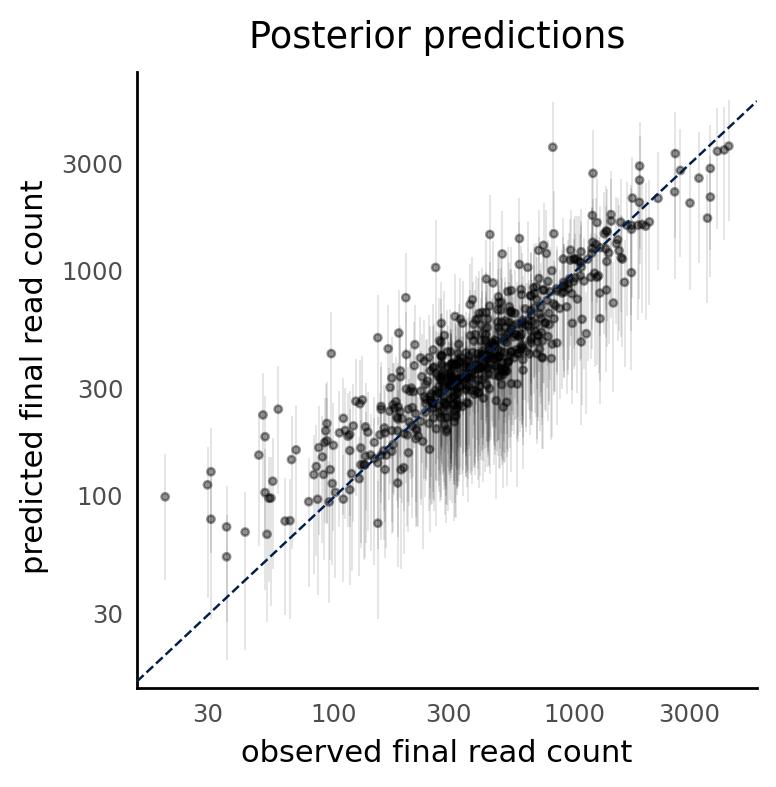

<ggplot: (368741370)>

In [61]:
m2_ppc = pmanal.summarize_posterior_predictions(
    m2_trace["posterior_predictive"]["y"].squeeze().values,
    merge_with=data,
    calc_error=True,
    observed_y="read_counts",
)

(
    gg.ggplot(m2_ppc, gg.aes(x="read_counts", y="pred_mean"))
    + gg.geom_linerange(
        gg.aes(ymin="pred_hdi_low", ymax="pred_hdi_high"),
        alpha=0.1,
        size=0.4,
    )
    + gg.geom_point(alpha=0.4, size=1)
    + gg.geom_abline(slope=1, intercept=0, linetype="--", color="#011F4B")
    + gg.scale_x_log10()
    + gg.scale_y_log10()
    + gg.labs(
        x="observed final read count",
        y="predicted final read count",
        title="Posterior predictions",
    )
)

## Model 3. Experimenting with copy number effect

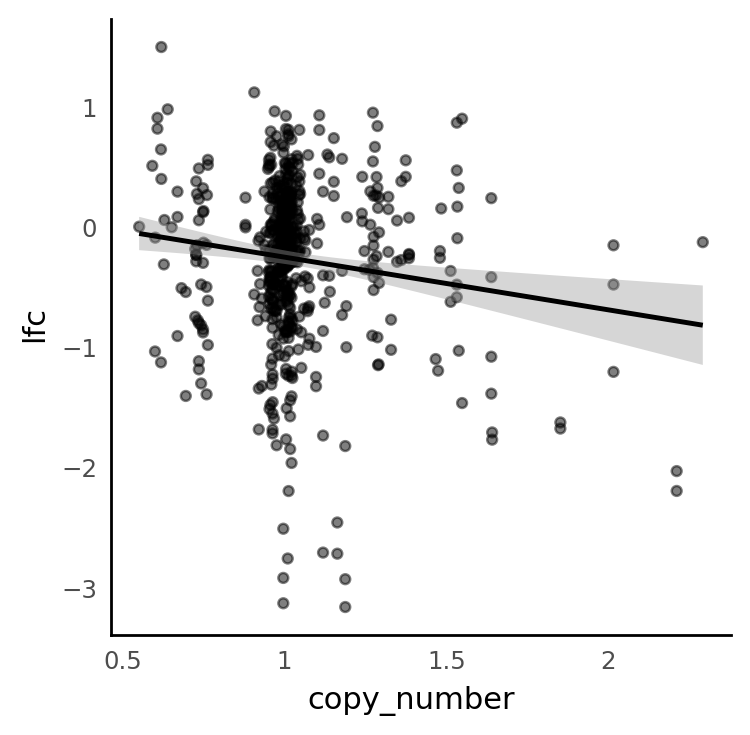

<ggplot: (367214252)>

In [62]:
(
    gg.ggplot(data, gg.aes(x="copy_number", y="lfc"))
    + gg.geom_point(alpha=0.5)
    + gg.geom_smooth(method="lm", formula="y~x")
)

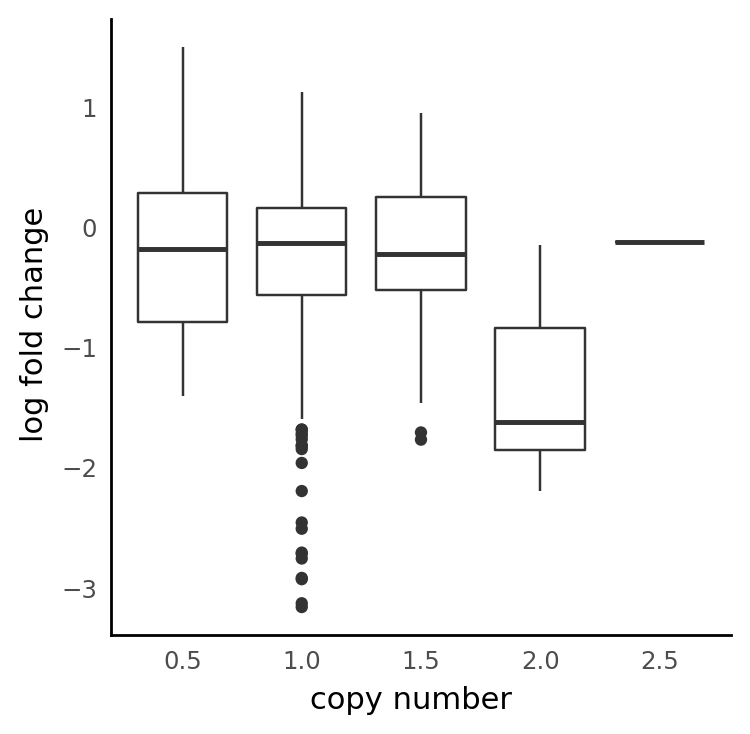

<ggplot: (366316301)>

In [63]:
(
    gg.ggplot(data, gg.aes(x="factor(np.round(copy_number*2)/2)", y="lfc"))
    + gg.geom_boxplot()
    + gg.labs(x="copy number", y="log fold change")
)

model formula:

$$
\begin{aligned}
\mu_\beta &\sim \text{N}(0, 2.5) \\
\sigma_\beta &\sim \text{HN}(2.5) \\
\beta_0 &\sim_g \text{N}(\mu_\beta, \sigma_\beta) \\
\beta_\text{CNA} &\sim \text{N}(0, 2.5) \\
\eta &= \beta_0 + \beta_\text{CNA} x_\text{cna} \\
\mu &= \exp(\eta) \\
\alpha &\sim \text{N}(0, 5) \\
y &\sim \text{NB}(\mu x_\text{initial}, \alpha)
\end{aligned}
$$

In [64]:
data["copy_number_scaled"] = vhelp.careful_zscore(data.copy_number.values)

with pm.Model() as nb_m3:
    g = pm.Data("g", dphelp.get_indices(data, "hugo_symbol"))
    x_cna = pm.Data("x_cna", data.copy_number_scaled.values)
    initial_count = pm.Data("initial_count", data.initial_reads.values)
    final_count = pm.Data("final_count", data.read_counts.values)

    μ_β = pm.Normal("μ_β", 0, 2.5)
    σ_β = pm.HalfNormal("σ_β", 2.5)

    β_0 = pm.Normal("β_0", μ_β, σ_β, shape=n_genes)
    β_cna = pm.Normal("β_cna", 0, 2.5)
    η = pm.Deterministic("η", β_0[g] + β_cna * x_cna)

    μ = pm.Deterministic("μ", pm.math.exp(η))
    α = pm.HalfNormal("α", 5)

    y = pm.NegativeBinomial("y", μ * initial_count, α, observed=final_count)

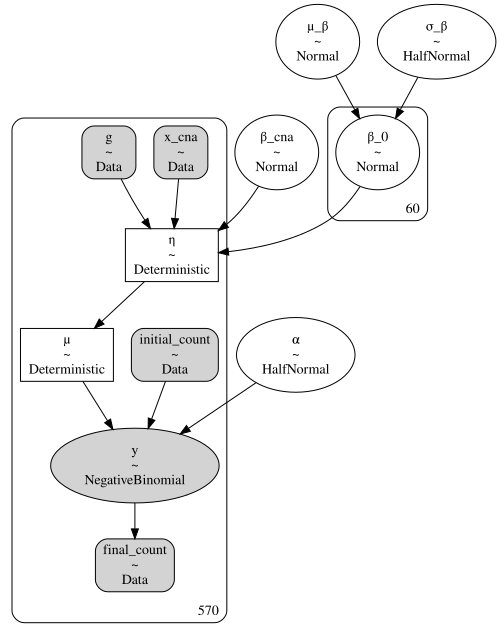

In [65]:
pm.model_to_graphviz(nb_m3)

In [66]:
with nb_m3:
    m3_trace = pm.sample(
        1000, tune=2000, chains=4, random_seed=154, return_inferencedata=True
    )
    ppc = pm.sample_posterior_predictive(m3_trace, random_seed=154)
    m3_trace.extend(az.from_pymc3(posterior_predictive=ppc))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [α, β_cna, β_0, σ_β, μ_β]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 54 seconds.


In [67]:
trace_collection["(m3): single CNA"] = m3_trace

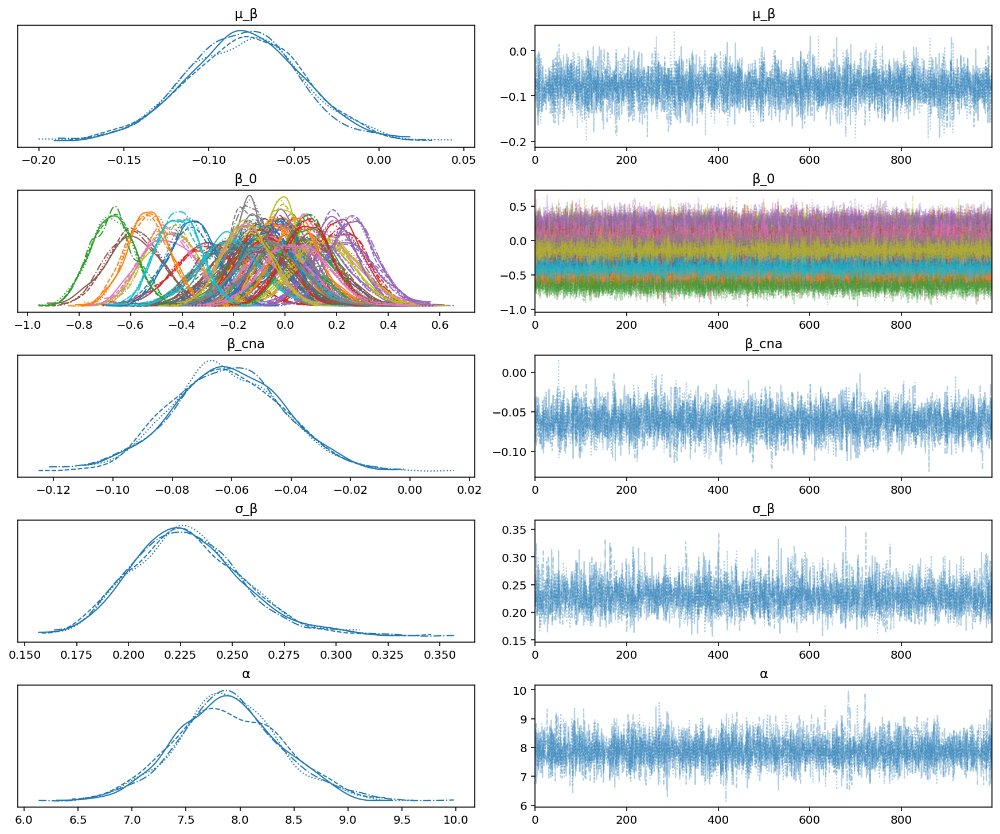

In [68]:
az.plot_trace(m3_trace, var_names=["α", "β"], filter_vars="like");

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions


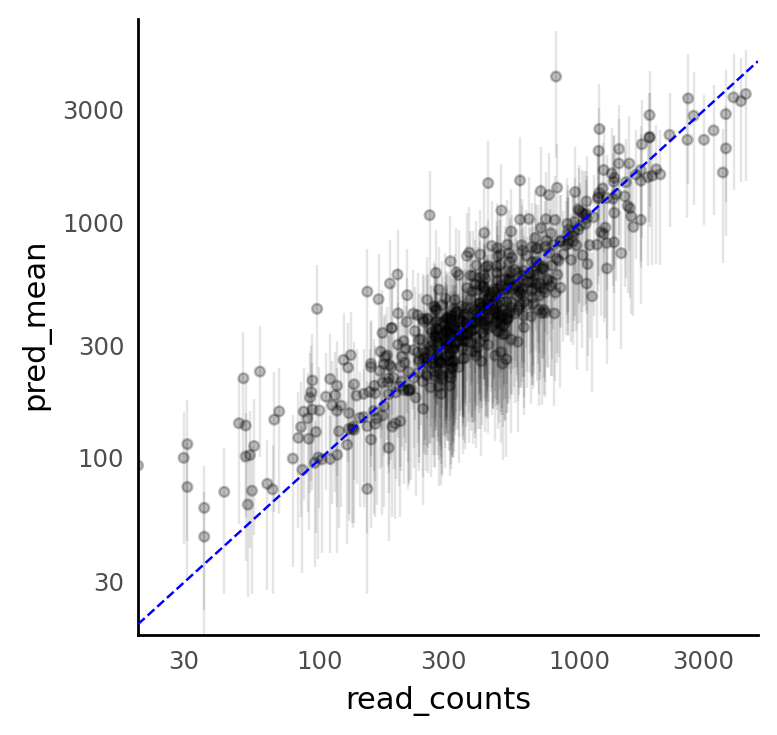

<ggplot: (367690042)>

In [69]:
m3_ppc_df = pmanal.summarize_posterior_predictions(
    m3_trace["posterior_predictive"]["y"].values.squeeze(),
    merge_with=data,
    observed_y="y",
)

(
    gg.ggplot(m3_ppc_df, gg.aes(x="read_counts", y="pred_mean"))
    + gg.geom_linerange(gg.aes(ymin="pred_hdi_low", ymax="pred_hdi_high"), alpha=0.1)
    + gg.geom_point(alpha=0.25)
    + gg.geom_abline(slope=1, intercept=0, linetype="--", color="blue")
    + gg.scale_x_log10(expand=(0, 0, 0.02, 0))
    + gg.scale_y_log10(expand=(0, 0, 0.02, 0))
)

In [70]:
def prep_ppc(m: az.InferenceData, name: str) -> pd.DataFrame:
    df = pmanal.summarize_posterior_predictions(
        m["posterior_predictive"]["y"].values.squeeze()
    ).rename(
        columns={
            "pred_mean": f"{name}_pred",
            "pred_hdi_low": f"{name}_hdi_low",
            "pred_hdi_high": f"{name}_hdi_high",
        }
    )
    return df

In [71]:
comparison_ppc_df = pd.concat(
    [prep_ppc(m, n) for m, n in [(m2_trace, "m2"), (m3_trace, "m3")]], axis=1
)

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:456: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions


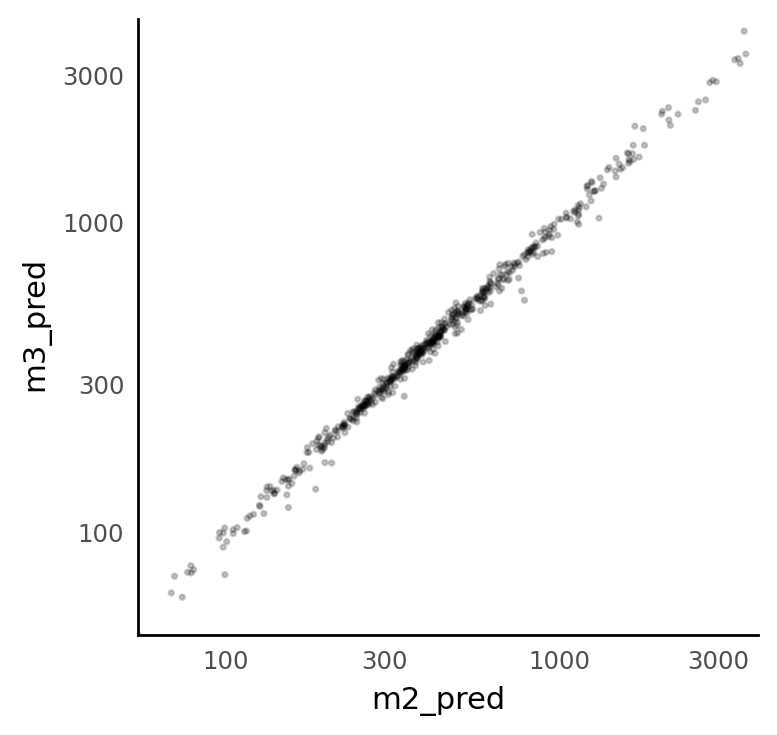

<ggplot: (367537785)>

In [72]:
(
    gg.ggplot(comparison_ppc_df, gg.aes(x="m2_pred", y="m3_pred"))
    + gg.geom_point(alpha=0.2, size=0.5)
    + gg.scale_x_log10(expand=(0, 0, 0.02, 0))
    + gg.scale_y_log10(expand=(0, 0, 0.02, 0))
)

In [73]:
def prep_posterior_beta(
    m: az.InferenceData, m_name: str, var_name: str, genes: Sequence[str]
) -> pd.DataFrame:
    df = az.summary(m, var_names=var_name, kind="stats", hdi_prob=0.89).assign(
        hugo_symbol=genes, model=m_name
    )
    return df

In [74]:
beta_posteriors = pd.concat(
    [
        prep_posterior_beta(m, n, b, data.hugo_symbol.cat.categories)
        for m, n, b in [(m1_trace, "m1", "β_g"), (m3_trace, "m3", "β_0")]
    ]
)

beta_posteriors.head()

,mean,sd,hdi_5.5%,hdi_94.5%,hugo_symbol,model
β_g[0],0.083,0.118,-0.120,0.258,ACVR1C,m1
β_g[1],-0.091,0.093,-0.233,0.058,ADPRHL1,m1
β_g[2],0.094,0.126,-0.116,0.289,APC,m1
β_g[3],-0.033,0.090,-0.181,0.107,BRAF,m1
β_g[4],-0.005,0.092,-0.149,0.147,CCR3,m1


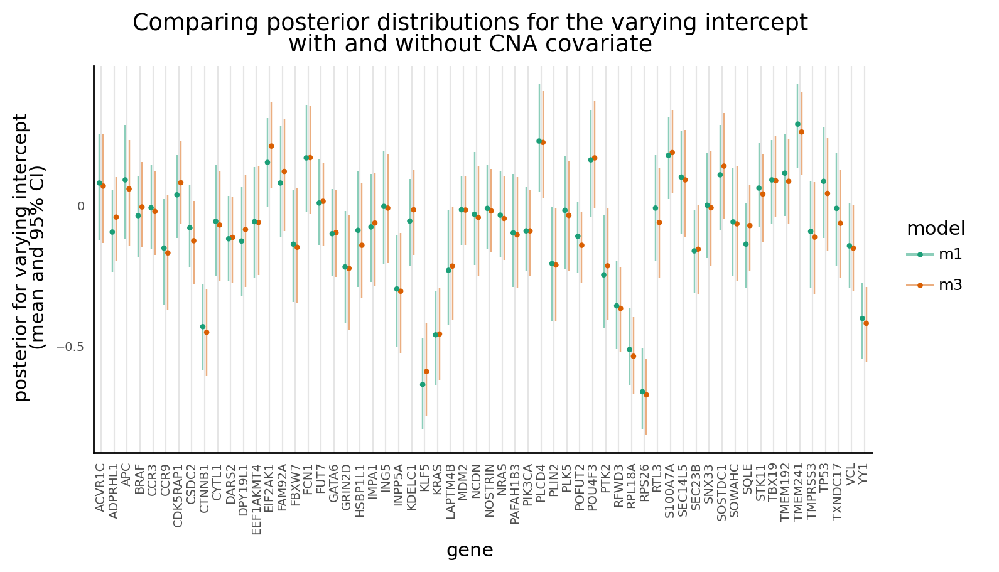

<ggplot: (363987797)>

In [75]:
pos = gg.position_dodge(width=0.6)
(
    gg.ggplot(beta_posteriors, gg.aes(x="hugo_symbol", y="mean", color="model"))
    + gg.geom_linerange(
        gg.aes(ymin="hdi_5.5%", ymax="hdi_94.5%"), position=pos, size=0.5, alpha=0.5
    )
    + gg.geom_point(position=pos, size=0.75)
    + gg.scale_color_brewer(type="qual", palette="Dark2")
    + gg.theme(
        axis_text_x=gg.element_text(size=7, angle=90),
        axis_text_y=gg.element_text(size=7),
        figure_size=(8, 4),
        panel_grid_major_x=gg.element_line(),
    )
    + gg.labs(
        x="gene",
        y="posterior for varying intercept\n(mean and 95% CI)",
        title="Comparing posterior distributions for the varying intercept\nwith and without CNA covariate",
    )
)

In [76]:
beta_cna_post = m3_trace["posterior"]["β_cna"].values.mean()
beta_cna_post

-0.061580945389013375

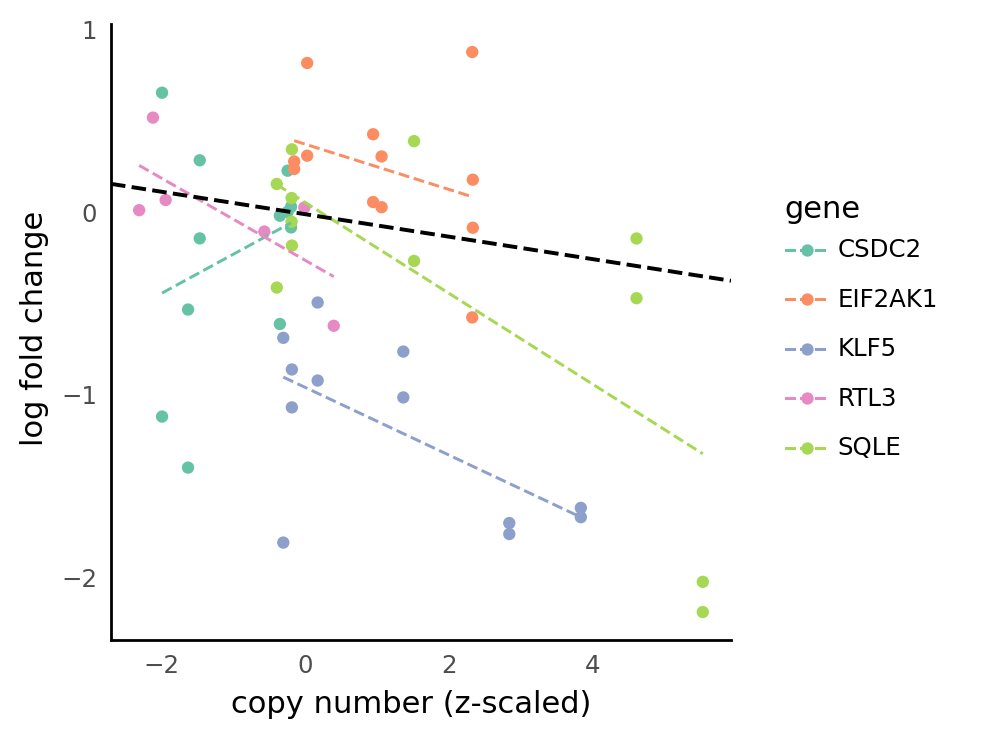

<ggplot: (366530036)>

In [77]:
gl = ["RTL3", "CSDC2", "KLF5", "EIF2AK1", "SQLE"]
#      down    down      up       up        up

(
    gg.ggplot(
        data[data.hugo_symbol.isin(gl)].assign(
            hugo_symbol=lambda d: d.hugo_symbol.astype(str)
        ),
        gg.aes(x="copy_number_scaled", y="lfc"),
    )
    + gg.geom_point(gg.aes(color="hugo_symbol"))
    + gg.geom_smooth(
        gg.aes(color="hugo_symbol"),
        formula="y~x",
        method="lm",
        linetype="--",
        se=False,
        size=0.6,
    )
    + gg.geom_abline(
        slope=beta_cna_post, intercept=0, color="black", linetype="--", size=0.8
    )
    + gg.scale_color_brewer(type="qual", palette="Set2")
    + gg.labs(x="copy number (z-scaled)", y="log fold change", color="gene")
)

## Model 4. Varying CNA covariate and intercept

model formula:

$$
\begin{aligned}
\mu_{\beta_0} &\sim \text{N}(0, 2.5) \quad \sigma_{\beta_0} \sim \text{HN}(2.5) \\
\mu_{\beta_\text{CNA}} &\sim \text{N}(0, 2.5) \quad \sigma_{\beta_\text{CNA}} \sim \text{HN}(2.5) \\
\beta_0 &\sim_g \text{N}(\mu_{\beta_0}, \sigma_{\beta_0}) \\
\beta_\text{CNA} &\sim_g \text{N}(\mu_{\beta_\text{CNA}}, \sigma_{\beta_\text{CNA}}) \\
\eta &= \beta_0[g] + x_\text{cna} \beta_\text{CNA}[g] \\
\mu &= \exp(\eta) \\
\alpha &\sim \text{N}(0, 5) \\
y &\sim \text{NB}(\mu x_\text{initial}, \alpha)
\end{aligned}
$$

In [78]:
data["copy_number_scaled"] = vhelp.careful_zscore(data.copy_number.values)


def make_hierarchical_noncentered_coef(
    name: str,
    shape: Union[float, tuple[float, ...]],
    mu_sd: float = 2.5,
    sigma_sd: float = 2.5,
) -> pm.model.FreeRV:
    μ = pm.Normal(f"μ_{name}", 0.0, mu_sd)
    σ = pm.HalfNormal(f"σ_{name}", sigma_sd)
    Δ = pm.Normal(f"Δ_{name}", 0.0, 1.0, shape=shape)
    β = pm.Deterministic(name, μ + Δ * σ)
    return β


with pm.Model() as nb_m4:
    g = pm.Data("g", dphelp.get_indices(data, "hugo_symbol"))
    x_cna = pm.Data("x_cna", data.copy_number_scaled.values)
    initial_count = pm.Data("initial_count", data.initial_reads.values)
    final_count = pm.Data("final_count", data.read_counts.values)

    β_0 = make_hierarchical_noncentered_coef("β_0", shape=n_genes)
    β_cna = make_hierarchical_noncentered_coef(
        "β_cna", shape=n_genes, mu_sd=1.0, sigma_sd=1.0
    )
    η = pm.Deterministic("η", β_0[g] + β_cna[g] * x_cna)

    μ = pm.Deterministic("μ", pm.math.exp(η))
    α = pm.HalfNormal("α", 5)

    y = pm.NegativeBinomial("y", μ * initial_count, α, observed=final_count)

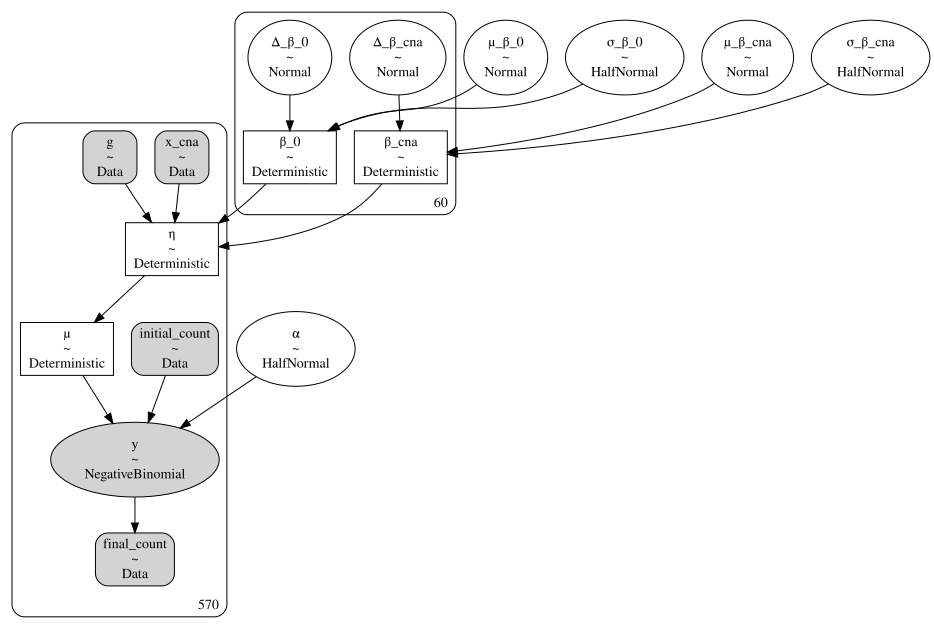

In [79]:
pm.model_to_graphviz(nb_m4)

In [80]:
with nb_m4:
    m4_trace = pm.sample(
        2000,
        chains=4,
        tune=3000,
        random_seed=400,
        target_accept=0.95,
        return_inferencedata=True,
    )
    ppc = pm.sample_posterior_predictive(m4_trace, random_seed=400)
    m4_trace.extend(az.from_pymc3(posterior_predictive=ppc))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 2 jobs)
NUTS: [α, Δ_β_cna, σ_β_cna, μ_β_cna, Δ_β_0, σ_β_0, μ_β_0]


Sampling 4 chains for 3_000 tune and 2_000 draw iterations (12_000 + 8_000 draws total) took 211 seconds.
The number of effective samples is smaller than 25% for some parameters.


In [81]:
trace_collection["(m4) varying CNA"] = m4_trace

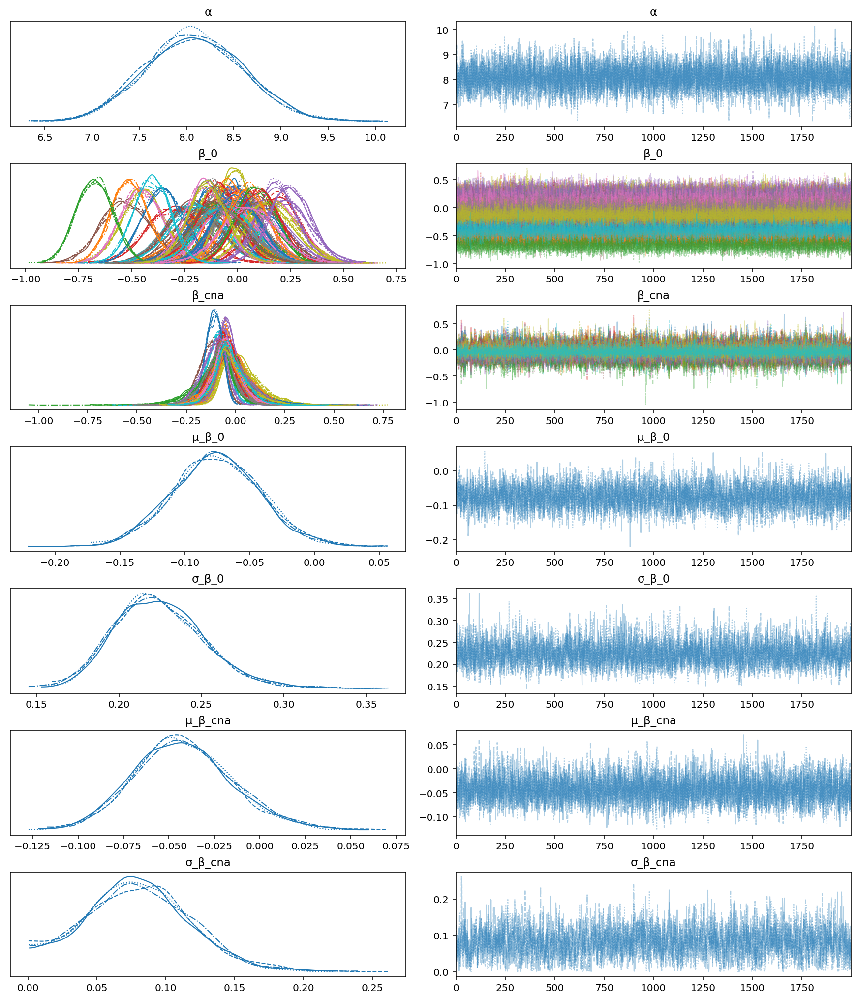

In [82]:
az.plot_trace(
    m4_trace, var_names=["α", "β_0", "β_cna", "μ_β_0", "σ_β_0", "μ_β_cna", "σ_β_cna"]
);

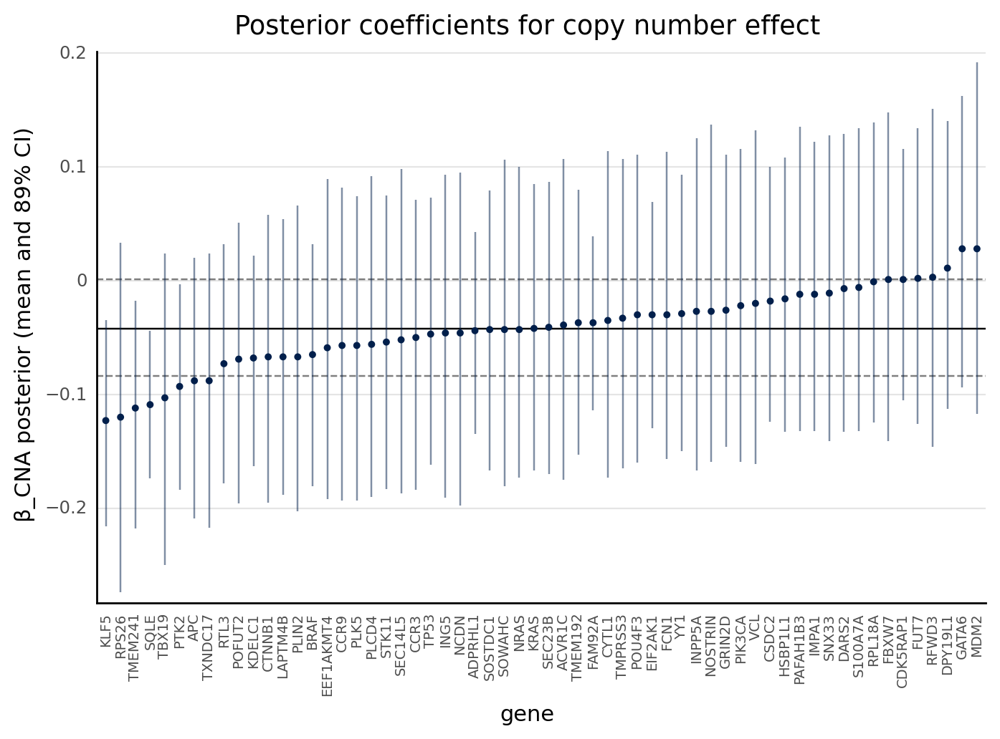

<ggplot: (363741561)>

In [83]:
m4_beta_cna_post_df = az.summary(m4_trace, var_names="β_cna", hdi_prob=0.89).assign(
    hugo_symbol=data.hugo_symbol.cat.categories
)

mu_beta_cna_post = az.summary(
    m4_trace, var_names="μ_β_cna", hdi_prob=0.89, kind="stats"
)

(
    gg.ggplot(
        m4_beta_cna_post_df.sort_values("mean").assign(
            hugo_symbol=lambda d: pd.Categorical(
                d.hugo_symbol.astype(str),
                ordered=True,
                categories=d.hugo_symbol.astype(str),
            )
        ),
        gg.aes(x="hugo_symbol", y="mean"),
    )
    + gg.geom_hline(yintercept=mu_beta_cna_post["mean"][0])
    + gg.geom_hline(
        yintercept=[mu_beta_cna_post["hdi_5.5%"][0], mu_beta_cna_post["hdi_94.5%"][0]],
        alpha=0.5,
        linetype="--",
    )
    + gg.geom_linerange(
        gg.aes(ymin="hdi_5.5%", ymax="hdi_94.5%"), color="#011F4B", alpha=0.5
    )
    + gg.geom_point(color="#011F4B", size=1)
    + gg.scale_y_continuous(expand=(0.02, 0, 0.02, 0))
    + gg.theme(
        figure_size=(8, 5),
        axis_text_x=gg.element_text(angle=90, size=7),
        panel_grid_major_y=gg.element_line(),
    )
    + gg.labs(
        x="gene",
        y="β_CNA posterior (mean and 89% CI)",
        title="Posterior coefficients for copy number effect",
    )
)

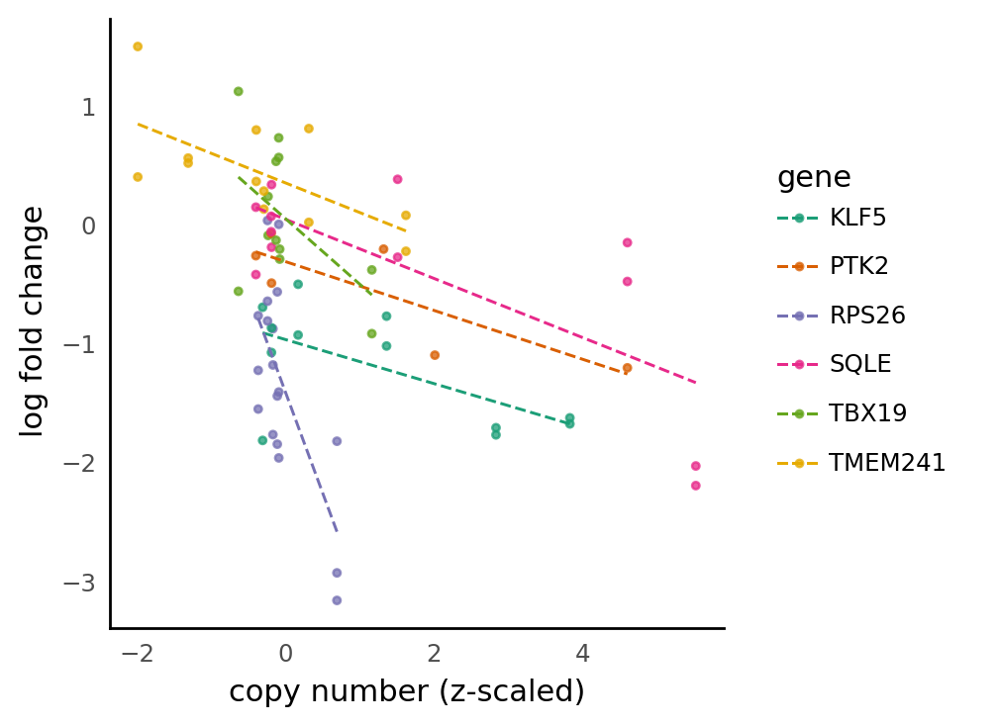

<ggplot: (368512199)>

In [84]:
gl = m4_beta_cna_post_df.sort_values("mean").head(n=6).hugo_symbol.values

(
    gg.ggplot(
        data[data.hugo_symbol.isin(gl)].assign(
            hugo_symbol=lambda d: d.hugo_symbol.astype(str)
        ),
        gg.aes(x="copy_number_scaled", y="lfc"),
    )
    + gg.geom_point(gg.aes(color="hugo_symbol"), size=1, alpha=0.75)
    + gg.geom_smooth(
        gg.aes(color="hugo_symbol"),
        formula="y~x",
        method="lm",
        linetype="--",
        se=False,
        size=0.6,
    )
    + gg.scale_color_brewer(type="qual", palette="Dark2")
    + gg.labs(x="copy number (z-scaled)", y="log fold change", color="gene")
)

## Final comparison of all models

Make sure to note that this analysis was conducted with a relatively small subset of the data.
Further, the amount of data per gene is quite small, limiting the hierarchical models.

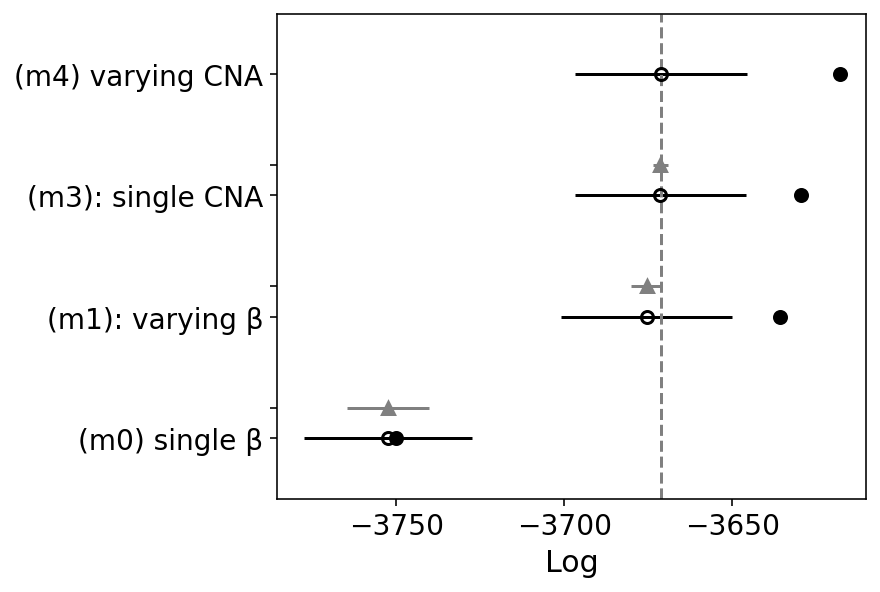

In [85]:
model_comparison = az.compare(trace_collection)
az.plot_compare(model_comparison);

In [86]:
model_comparison

,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
(m4) varying CNA,0,-3671.334442,53.263715,0.000000,5.321194e-01,25.612641,0.000000,False,log
(m3): single CNA,1,-3671.443414,41.760554,0.108973,2.501019e-01,25.390234,2.273203,False,log
(m1): varying β,2,-3675.537718,39.705807,4.203277,2.177787e-01,25.478605,4.647333,False,log
(m0) single β,3,-3752.388299,2.346482,81.053857,1.110223e-16,25.017064,12.145775,False,log


---

In [87]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 16.00 minutes


In [88]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2021-09-10

Python implementation: CPython
Python version       : 3.9.6
IPython version      : 7.26.0

Compiler    : Clang 11.1.0 
OS          : Darwin
Release     : 20.4.0
Machine     : x86_64
Processor   : i386
CPU cores   : 4
Architecture: 64bit

Hostname: JHCookMac.local

Git branch: nb-model

seaborn   : 0.11.2
pandas    : 1.3.2
re        : 2.2.1
plotnine  : 0.8.0
janitor   : 0.21.0
arviz     : 0.11.2
matplotlib: 3.4.3
theano    : 1.0.5
pymc3     : 3.11.2
numpy     : 1.21.2

